# Proyecto Predicion desarrollo Humano / Genero 

Data Set from World Bank

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("HDR21-22_Composite_indices_complete_time_series.csv", header = 0)
df = pd.DataFrame(data)

df.drop(df.filter(regex='region|gdi_group_|lfpr_f_|gni_pc_f_|ineq_edu_|hdi_f|ineq_le_|coef_ineq_|hdi_rank_|ihdi|ifdi_f|gii_|gdi_|iso3|mys_f|ineq_inc|hdicode|loss|gii_rank|hdi_m|le_m|eys_m|mys_m|se_m|lfpr_m|pr_m|gni_pc_m|rankdiff_hdi_phdi|diff_hdi_phdi|mf|phdi').columns, axis=1, inplace=True) 

#print(df)

In [2]:
# Utilizamos melt para transformar los datos

df_melted = pd.melt(
    df,
    id_vars=['country','continent'],
    var_name='variable',
    value_name='valor'
)
# Extraemos el año de la columna 'variable' y creamos una nueva columna 'año'
df_melted['año'] = df_melted['variable'].str.extract(r'(\d{4})')
# Extraemos el prefijo de la columna 'variable' y creamos una nueva columna 'indicador'
df_melted['indicador'] = df_melted['variable'].str.replace(r'\d+','') #queda sin el _
# Eliminamos la columna 'variable'
df_melted = df_melted.drop('variable', axis=1)
# Creamos columnas para cada indicador usando pivot_table
df_final = df_melted.pivot_table(index=[ 'country', 'continent', 'año'],
                                columns='indicador',
                                values='valor',
                                aggfunc='first').reset_index()
# Reorganizamos las columnas
#df_final = df_final[['iso3', 'country', 'hdicode', 'region', 'hdi_rank_2021', 'año', 'hdi','le', 'eys', 'gnipc', 'gdi','ihdi','gii', 'mmr','abr','hdif']]
# Mostramos el resultado
df_final


# 'gdi_group', 'hdi_f', 'le_f', 'eys_f', 'mys_f', 'ineq_edu','hdi_f' ,'coef_ineq', 'gni_pc_f','coef_ineq', 'ineq_le', 'se_f', 'pr_f', 'lfpr_f','co2_prod'




/var/folders/tv/7kkz5st555g_218zhr0c3rkc0000gn/T/ipykernel_2862/1547594210.py:12: FutureWarning: The default value of regex will change from True to False in a future version.
  df_melted['indicador'] = df_melted['variable'].str.replace(r'\d+','') #queda sin el _


indicador,country,continent,año,abr_,co_prod_,eys_,eys_f_,gnipc_,hdi_,le_,le_f_,mmr_,mys_,pr_f_,se_f_
0,Afghanistan,Asia,1990,142.960,0.209727,2.504050,1.970663,2684.550019,0.273,45.9672,48.3973,1500.0,0.971125,NaN,0.700485
1,Afghanistan,Asia,1991,147.525,0.182525,2.806550,2.096679,2276.289409,0.279,46.6631,49.1439,1530.0,1.019356,NaN,0.772361
2,Afghanistan,Asia,1992,147.521,0.095233,3.109050,2.230753,2059.868084,0.287,47.5955,50.3197,1520.0,1.067586,NaN,0.844236
3,Afghanistan,Asia,1993,147.896,0.084285,3.411550,2.373401,1525.533426,0.297,51.4664,52.7389,1480.0,1.115817,NaN,0.916112
4,Afghanistan,Asia,1994,155.669,0.075054,3.714050,2.525171,1087.961890,0.292,51.4945,53.5442,1540.0,1.164047,NaN,0.987988
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6235,Zimbabwe,Africa,2017,98.265,0.673026,11.853943,11.682607,3728.918785,0.594,60.7095,62.9561,458.0,8.461690,36.151604,59.792019
6236,Zimbabwe,Africa,2018,98.507,0.821010,11.981767,11.822753,3864.012419,0.602,61.4141,63.5940,458.0,8.585395,34.285714,60.772083
6237,Zimbabwe,Africa,2019,97.354,0.747610,12.110969,11.964580,3674.564482,0.601,61.2925,63.6614,458.0,8.710909,34.571429,61.768211
6238,Zimbabwe,Africa,2020,96.180,0.708562,12.110969,11.964580,3654.289051,0.600,61.1242,63.8616,458.0,8.710909,34.571429,61.768211


In [3]:
pd.options.display.max_columns = None

pd.options.display.max_rows = None


In [4]:
#transformar año en INT
df_final.año = df_final.año.astype(int)

In [5]:
df_new = df_final[df_final['año']>= 2000]

In [6]:
#ver numero columnas y filas
df_new.shape

(4290, 15)

In [7]:
#quitamos 'San Marino' de la lista
df_new= df_new[df_new.country!='San Marino']

In [8]:
df_new= df_new[df_new.country!='Monaco']


In [9]:
df_new= df_new[df_new.country!="Korea (Democratic People's Rep. of)"]

In [10]:
df_new= df_new[df_new.country!='Hong Kong, China (SAR)']

In [11]:
df_new= df_new[df_new.country!='Liechtenstein']

In [12]:
#miro co_prod de Timo Leste, ya que tiene Nan en unos años y quiero ver si los puedo igualar a los valores siguientes. 
df_new[(df_new.country == 'Timor-Leste') & (df_new.año <= 2005)]

indicador,country,continent,año,abr_,co_prod_,eys_,eys_f_,gnipc_,hdi_,le_,le_f_,mmr_,mys_,pr_f_,se_f_
5578,Timor-Leste,Asia,2000,60.364,NaN,NaN,NaN,3076.594165,NaN,58.5676,60.1586,745.0,3.120541,NaN,10.744232
5579,Timor-Leste,Asia,2001,60.764,NaN,NaN,NaN,3395.503646,NaN,59.3619,60.9780,720.0,3.231405,NaN,11.550530
5580,Timor-Leste,Asia,2002,60.781,0.174727,10.024220,NaN,3703.941730,0.508,60.1483,61.7764,668.0,3.346208,26.136364,12.417336
5581,Timor-Leste,Asia,2003,56.853,0.170223,10.388592,NaN,3042.313789,0.508,60.8707,62.5074,603.0,3.465089,26.136364,13.349192
5582,Timor-Leste,Asia,2004,54.704,0.180956,10.752963,NaN,3296.006256,0.521,61.6281,63.3195,507.0,3.588194,25.287356,14.350978
5583,Timor-Leste,Asia,2005,53.298,0.176730,11.117334,10.4737,3901.885426,0.538,62.3283,64.0002,415.0,3.715673,25.287356,15.427943


In [13]:
#le digo que coja el primer valor TRUE para fillna los Nan anteriores
df_new.loc[df_new.country == 'Timor-Leste'] = df_new[df_new.country == 'Timor-Leste'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [14]:
#df_new[(df_new.country == 'Timor-Leste') & (df_new.año <= 2009)]

In [15]:
#df_new[(df_new.country == 'Timor-Leste') & (df_new.año <= 2009)]

In [16]:
#df_new[(df_new.country == 'Afghanistan') & (df_new.año <= 2005)]

In [17]:
#df_new[(df_new.country == 'Afganistan') & (df_new.año <= 2009)]
df_new.loc[df_new.country == 'Afghanistan'] = df_new[df_new.country == 'Afghanistan'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [18]:
#df_new[(df_new.country == 'Afghanistan') & (df_new.año <= 2011)]

In [19]:
#df_new[(df_new.country == 'Antigua and Barbuda') & (df_new.año <= 2009)]

In [20]:
df_new.loc[df_new.country == 'Antigua and Barbuda'] = df_new[df_new.country == 'Antigua and Barbuda'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [21]:
#df_new[(df_new.country == 'South Sudan') & (df_new.año <= 2015)]

In [22]:
df_new.loc[df_new.country == 'South Sudan'] = df_new[df_new.country == 'South Sudan'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [23]:
#df_new[df_new['mmr_'].isna()]

In [24]:
#df_new[df_new.mmr_.isnull()].country.unique()

In [25]:
df_new.loc[df_new.country == 'Marshall Islands'] = df_new[df_new.country == 'Marshall Islands'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [26]:
df_new.loc[df_new.country == 'Afganistan'] = df_new[df_new.country == 'Afganistan'].sort_values(by='año',ascending= False).fillna(method='ffill') 


In [27]:
df_new.loc[df_new.country == 'Chad'] = df_new[df_new.country == 'Chad'].sort_values(by='año',ascending= False).fillna(method='ffill') 


In [28]:
df_new.loc[df_new.country == 'Bhutan'] = df_new[df_new.country == 'Bhutan'].sort_values(by='año',ascending= False).fillna(method='ffill') 


In [29]:
df_new.loc[df_new.country == 'Brazil'] = df_new[df_new.country == 'Brazil'].sort_values(by='año',ascending= False).fillna(method='ffill') 


In [30]:
df_new.loc[df_new.country == 'Ecuador'] = df_new[df_new.country == 'Ecuador'].sort_values(by='año',ascending= False).fillna(method='ffill') 


In [31]:
df_new.loc[df_new.country == 'Eritrea'] = df_new[df_new.country == 'Eritrea'].sort_values(by='año',ascending= False).fillna(method='ffill') 


In [32]:
df_new.loc[df_new.country == 'Ethiopia'] = df_new[df_new.country == 'Ethiopia'].sort_values(by='año',ascending= False).fillna(method='ffill') 


In [33]:
df_new.loc[df_new.country == 'Grenada'] = df_new[df_new.country == 'Grenada'].sort_values(by='año',ascending= False).fillna(method='ffill') 


In [34]:
df_new.loc[df_new.country == 'South Sudan'] = df_new[df_new.country == 'South Sudan'].sort_values(by='año',ascending= False).fillna(method='ffill') 


In [35]:
df_new.loc[df_new.country == 'Haiti'] = df_new[df_new.country == 'Haiti'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [36]:
df_new.loc[df_new.country == 'Montenegro'] = df_new[df_new.country == 'Montenegro'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [37]:
df_new.loc[df_new.country == 'Nauru'] = df_new[df_new.country == 'Nauru'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [38]:
df_new.loc[df_new.country == 'Myanmar'] = df_new[df_new.country == 'Myanmar'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [39]:
df_new.loc[df_new.country == 'Congo (Democratic Republic of the)'] = df_new[df_new.country == 'Congo (Democratic Republic of the)'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [40]:
df_new.loc[df_new.country == 'Bosnia and Herzegovina'] = df_new[df_new.country == 'Bosnia and Herzegovina'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [41]:
df_new.loc[df_new.country == 'Nicaragua'] = df_new[df_new.country == 'Nicaragua'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [42]:
df_new.loc[df_new.country == 'Nigeria'] = df_new[df_new.country == 'Nigeria'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [43]:
df_new.loc[df_new.country == 'Oman'] = df_new[df_new.country == 'Oman'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [44]:
df_new.loc[df_new.country == 'Palau'] = df_new[df_new.country == 'Palau'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [45]:
df_new.loc[df_new.country == 'Palestine'] = df_new[df_new.country == 'Palestine'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [46]:
df_new.loc[df_new.country == 'Serbia'] = df_new[df_new.country == 'Serbia'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [47]:
df_new.loc[df_new.country == 'Samoa'] = df_new[df_new.country == 'Samoa'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [48]:
df_new.loc[df_new.country == 'Paraguay'] = df_new[df_new.country == 'Paraguay'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [49]:
df_new.loc[df_new.country == 'Peru'] = df_new[df_new.country == 'Peru'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [50]:
df_new.loc[df_new.country == 'Guinea-Bissau'] = df_new[df_new.country == 'Guinea-Bissau'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [51]:
df_new.loc[df_new.country == 'Russian Federation'] = df_new[df_new.country == 'Russian Federation'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [52]:
df_new.loc[df_new.country == 'Saint Vincent and the Grenadines'] = df_new[df_new.country == 'Saint Vincent and the Grenadines'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [53]:
df_new.loc[df_new.country == 'Saint Kitts and Nevis'] = df_new[df_new.country == 'Saint Kitts and Nevis'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [54]:
df_new.loc[df_new.country == 'Libya'] = df_new[df_new.country == 'Libya'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [55]:
df_new.loc[df_new.country == 'Andorra'] = df_new[df_new.country == 'Andorra'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [56]:
df_new.loc[df_new.country == 'Marshall Islands'] = df_new[df_new.country == 'Marshall Islands'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [57]:
df_new.loc[df_new.country == 'Bahrain'] = df_new[df_new.country == 'Bahrain'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [58]:
df_new.loc[df_new.country == 'Belarus'] = df_new[df_new.country == 'Belarus'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [59]:


df_new.loc[df_new.country == 'Brunei Darussalam'] = df_new[df_new.country == 'Brunei Darussalam'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [60]:
df_new.loc[df_new.country == 'Somalia'] = df_new[df_new.country == 'Somalia'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [61]:
df_new.loc[df_new.country == 'Suriname'] = df_new[df_new.country == 'Suriname'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [62]:
df_new.loc[df_new.country == 'Turkmenistan'] = df_new[df_new.country == 'Turkmenistan'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [63]:
df_new.loc[df_new.country == 'Vanuatu'] = df_new[df_new.country == 'Vanuatu'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [64]:
df_new.loc[df_new.country == 'Lebanon'] = df_new[df_new.country == 'Lebanon'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [65]:


df_new.loc[df_new.country == 'Palestine, State of'] = df_new[df_new.country == 'Palestine, State of'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [66]:
#df_new[df_new.pr_f_.isnull()].country.unique()

In [67]:
#df_new[df_new.gnipc_.isnull()].country.unique()

In [68]:
#df_new

In [69]:
#df_new.loc[df['country'] == 'Andorra', 'eys_f_'] = df_new.loc[df['country'] == 'Andorra', 'eys_f_'].fillna(13.3)
mask = (df_new['country'] == 'Andorra')
df_new.loc[mask, 'eys_f_'] = df_new.loc[mask, 'eys_f_'].fillna(13.3)
df_new.loc[mask, 'mmr_'] = df_new.loc[mask, 'mmr_'].fillna(0)

In [70]:
mask = (df_new['country'] == 'Dominica')
df_new.loc[mask, 'eys_f_'] = df_new.loc[mask, 'mmr_'].fillna(11.3)

In [71]:
mask = (df_new['country'] == 'Bahamas')
df_new.loc[mask, 'eys_f_'] = df_new.loc[mask, 'eys_f_'].fillna(11.3)

In [72]:
mask = (df_new['country'] == 'Equatorial Guinea')
df_new.loc[mask, 'eys_f_'] = df_new.loc[mask, 'eys_f_'].fillna(5)

In [73]:
mask = (df_new['country'] == 'Somalia')
df_new.loc[mask, 'eys_f_'] = df_new.loc[mask, 'eys_f_'].fillna(2)

In [74]:
mask = (df_new['country'] == 'Somalia')
df_new.loc[mask, 'eys_'] = df_new.loc[mask, 'eys_'].fillna(5.1)

In [75]:
mask = (df_new['country'] == 'Somalia')
df_new.loc[mask, 'mys_'] = df_new.loc[mask, 'mys_'].fillna(3.5)

In [76]:
mask = (df_new['country'] == 'Qatar')
df_new.loc[mask, 'pr_f_'] = df_new.loc[mask, 'pr_f_'].fillna(60.5)

In [77]:
mask = (df_new['country'] == 'Saint Kitts and Nevis')
df_new.loc[mask, 'mmr_'] = df_new.loc[mask, 'mmr_'].fillna(2)

In [78]:
df_new[df_new.mmr_.isnull()].country.unique()

array([], dtype=object)

In [79]:
mask = (df_new['country'] == 'Dominica')
df_new.loc[mask, 'mmr_'] = df_new.loc[mask, 'mmr_'].fillna(33.4)

#mask = (df_new['country'] == 'Dominica') & (df_new['año'] < 2005)
#df_new.loc[mask] = df_new.loc[mask].sort_values(by='año', ascending=False).fillna(method='ffill')


In [80]:
#df_new[(df_new.country == 'Guinea-Bissau') & (df_new.año <= 2008)]

In [81]:
df_new.loc[df_new.country == 'Guinea-Bissau'] = df_new[df_new.country == 'Guinea-Bissau'].sort_values(by='año',ascending= False).fillna(method='ffill') 

In [82]:
mask = (df_new['country'] == 'Micronesia (Federated States of)')
df_new.loc[mask, 'eys_f_'] = df_new.loc[mask, 'pr_f_'].fillna(5.692)

In [83]:
mask = (df_new['country'] == 'Palestine, State of')
df_new.loc[mask, 'pr_f_'] = df_new.loc[mask, 'pr_f_'].fillna(13.77)

In [84]:
#df_new[df_new.hdi_.isnull()].country.unique()

In [85]:

mask = (df_new['country'] == 'Saudi Arabia')
df_new.loc[mask, 'pr_f_'] = df_new.loc[mask, 'pr_f_'].fillna(23)

In [86]:

mask = (df_new['country'] == 'Somalia')
df_new.loc[mask, 'hdi_'] = df_new.loc[mask, 'hdi_'].fillna(0.364)

In [87]:
mask = (df_new['country'] == 'Nauru')
df_new.loc[mask, 'hdi_'] = df_new.loc[mask, 'hdi_'].fillna(0.72)

In [88]:

mask = (df_new['country'] == 'Nauru')
df_new.loc[mask, 'mys_'] = df_new.loc[mask, 'mys_'].fillna(6.5)

In [89]:
#df_new.isnull().sum()

In [90]:

mask = (df_new['country'] == 'Libya')
df_new.loc[mask, 'pr_f_'] = df_new.loc[mask, 'pr_f_'].fillna(4.736842)

In [91]:
#df_new

In [92]:
df_new.columns

Index(['country', 'continent', 'año', 'abr_', 'co_prod_', 'eys_', 'eys_f_',
       'gnipc_', 'hdi_', 'le_', 'le_f_', 'mmr_', 'mys_', 'pr_f_', 'se_f_'],
      dtype='object', name='indicador')

Gross National Income (GNI) per capita. GNI per capita is a measure of the average income of a country's residents. It is calculated by dividing a country's GNI by its population. This metric provides insight into the overall economic well-being of a country's citizens.

Mean Years of Schooling. This variable typically represents the average number of years of education received by a country's population. It is a measure of the educational attainment or literacy level of the population.

Expected Years of Schooling. Expected Years of Schooling is a measure of the number of years of education a child entering school can expect to receive, assuming that current enrollment and educational attainment patterns remain constant. It provides a projection of the educational opportunities available to the younger generation.

Life Expectancy at Birth. Life expectancy represents the average number of years a person can expect to live from birth. It is a key indicator of the overall health and quality of life in a country.

Human Development Index. The HDI is a composite index that measures overall human development by combining indicators of income, education, and health. It provides a broad assessment of a country's development status.

Expected Years of Schooling for Females. Similar to "eys," it represents the number of years of education that a female child entering school can expect to receive.

Mean Years of Schooling for Females. This variable probably represents the average number of years of education received by the female population.

Maternal Mortality Rate. The number of maternal deaths per 100,000 live births.

Adolescent Birth Rate. The rate of births among adolescent females.

Share of Seats in Parliament held by Females.

Participation Rate of Females in the Labor Force.

"co2_prod": CO2 Production or Carbon Dioxide Emissions.



In [93]:
# Cambiar el nombre de las columnas
nuevos_nombres = ['Country', 'Continent', 'Year', 'Adolescent Birth Rate', 'co_prod_', 'Expected Years of Schooling', 'Expected Years of Schooling for Females',
       'Gross National Income per capita', 'Human Development Index', 'Life Expectancy at Birth', 'Females Life Expectancy at Birth', 'Maternal Mortality Rate', 'Mean Years of Schooling', 'Participation Rate of Females in the Labor Force', 'Female Share of Seats in Parliament']
df_new.columns = nuevos_nombres

# Mostrar el DataFrame con los nombres de columnas cambiados
print("\nDataFrame con nombres de columnas cambiados:")
print(df_new)



DataFrame con nombres de columnas cambiados:
                                 Country          Continent  Year  \
10                           Afghanistan               Asia  2000   
11                           Afghanistan               Asia  2001   
12                           Afghanistan               Asia  2002   
13                           Afghanistan               Asia  2003   
14                           Afghanistan               Asia  2004   
15                           Afghanistan               Asia  2005   
16                           Afghanistan               Asia  2006   
17                           Afghanistan               Asia  2007   
18                           Afghanistan               Asia  2008   
19                           Afghanistan               Asia  2009   
20                           Afghanistan               Asia  2010   
21                           Afghanistan               Asia  2011   
22                           Afghanistan               As

In [94]:
df_new

,Country,Continent,Year,Adolescent Birth Rate,co_prod_,Expected Years of Schooling,Expected Years of Schooling for Females,Gross National Income per capita,Human Development Index,Life Expectancy at Birth,Females Life Expectancy at Birth,Maternal Mortality Rate,Mean Years of Schooling,Participation Rate of Females in the Labor Force,Female Share of Seats in Parliament
10,Afghanistan,Asia,2000,152.572,0.036462,5.529050,3.662762,984.997434,0.335,55.2978,56.8579,1450.0,1.407806,25.925926,1.367468
11,Afghanistan,Asia,2001,150.863,0.036931,5.831550,3.896981,894.024589,0.337,55.7981,57.3437,1390.0,1.465161,25.925926,1.476500
12,Afghanistan,Asia,2002,148.141,0.046529,6.134050,4.146178,1267.628852,0.362,56.4538,57.6715,1300.0,1.522516,25.925926,1.585532
13,Afghanistan,Asia,2003,143.370,0.050083,6.436550,4.411310,1401.324413,0.376,57.3445,58.6498,1240.0,1.579871,25.925926,1.694564
14,Afghanistan,Asia,2004,138.827,0.035960,7.393880,4.137720,1384.695729,0.392,57.9436,59.2159,1180.0,1.637226,25.925926,1.803596
15,Afghanistan,Asia,2005,133.071,0.050802,7.660418,4.592572,1435.191730,0.400,58.3608,59.6966,1140.0,1.694581,25.925926,1.912628
16,Afghanistan,Asia,2006,126.106,0.061870,7.926956,5.047424,1518.767846,0.409,58.6844,60.2431,1120.0,1.776703,25.925926,1.887654
17,Afghanistan,Asia,2007,125.858,0.083711,8.193494,5.502276,1811.166659,0.424,59.1113,60.9090,1090.0,1.858825,25.872093,1.862680
18,Afghanistan,Asia,2008,128.171,0.151485,8.460032,5.957128,1753.066993,0.430,59.8515,61.5289,1030.0,1.940947,25.872093,1.837706
19,Afghanistan,Asia,2009,120.635,0.237367,8.726570,6.411980,1884.200863,0.440,60.3636,61.8922,993.0,2.023069,25.925926,1.812733


In [95]:
import matplotlib.pyplot as plt

/var/folders/tv/7kkz5st555g_218zhr0c3rkc0000gn/T/ipykernel_2862/1938328722.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr=df_new.corr()


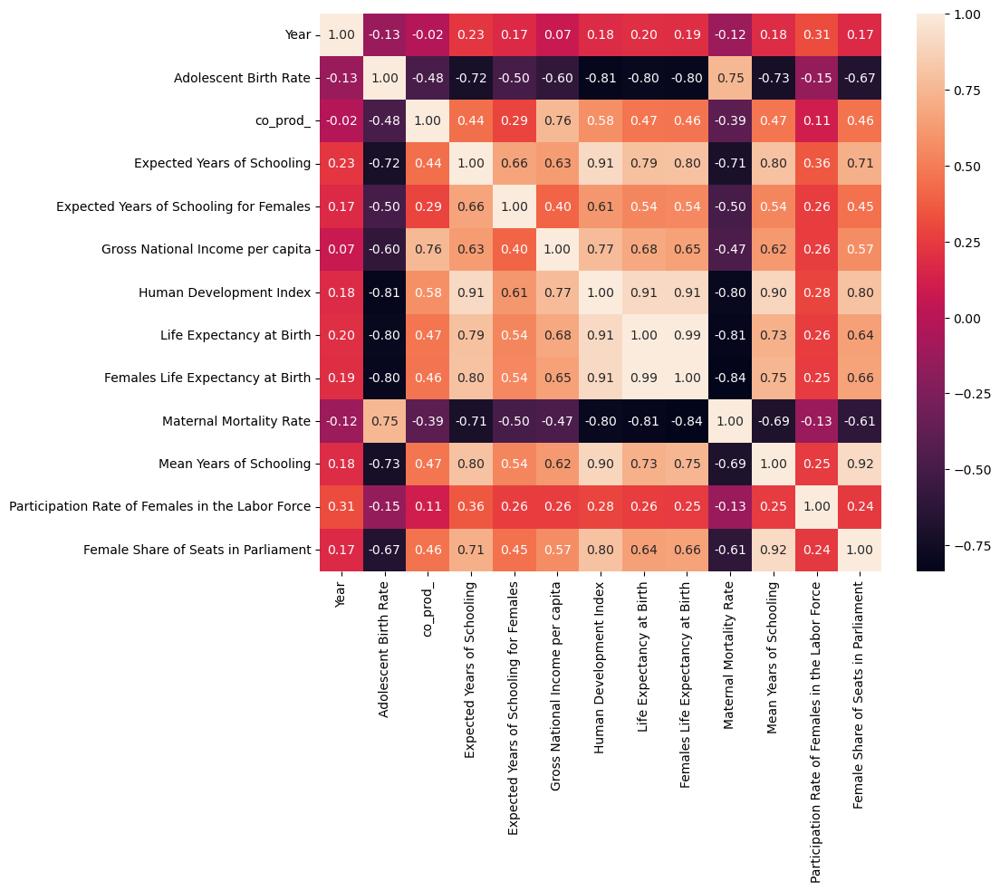

In [96]:
corr=df_new.corr()
plt.figure(figsize=(10,8)) #grafico mas grande
sns.heatmap(corr,annot=True,fmt=".2f");  #info en dos decimales


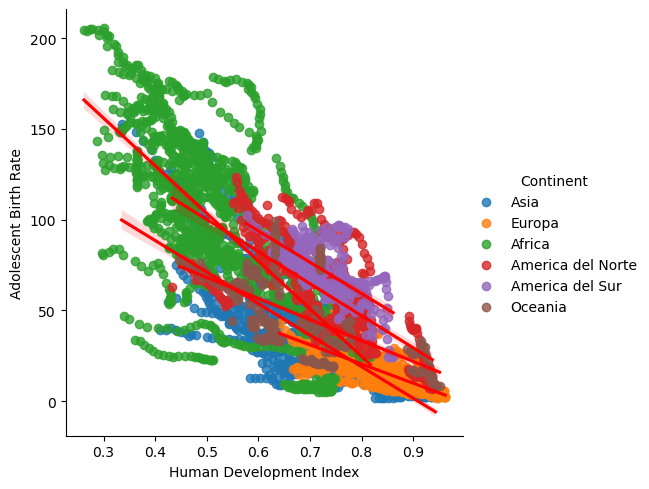

In [97]:


sns.lmplot(data=df_new, x="Human Development Index",y="Adolescent Birth Rate",hue="Continent", line_kws= {'color':'red'})

<AxesSubplot:xlabel='Human Development Index', ylabel='Adolescent Birth Rate'>

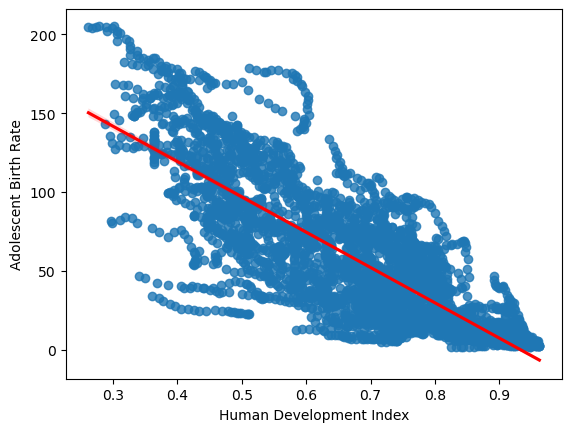

In [98]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.regplot(data=df_new, x="Human Development Index",y="Adolescent Birth Rate", line_kws= {'color':'red'})

#anadir una dimension mas con region/continente para distinguir y facilitar visualizacion

In [99]:
#plt.figure(figsize=(15,38))
#sns.barplot(data=df_new, x= 'mmr_', y ='continent',hue='hdi_')

In [100]:
df_new.groupby('Country')['Human Development Index'].mean().sort_values(ascending=False).head(5)

Country
Norway         0.941182
Switzerland    0.931818
Germany        0.925727
Australia      0.923455
Denmark        0.922000
Name: Human Development Index, dtype: float64

In [101]:
df_new.groupby('Country')['Human Development Index'].mean().sort_values(ascending=True).head(5).drop('Somalia')

Country
Niger                       0.339000
Chad                        0.358045
Central African Republic    0.368318
Burkina Faso                0.376545
Name: Human Development Index, dtype: float64

In [102]:


# Your existing code
result = df_new.groupby('Country')['Human Development Index'].mean().sort_values(ascending=True).head(5).drop('Somalia')

# Extract country names
top_countries_list = result.index.tolist()

# Print the list
print(top_countries_list)


['Niger', 'Chad', 'Central African Republic', 'Burkina Faso']


In [103]:

# Your existing code
result = df_new.groupby('Country')['Human Development Index'].mean().sort_values(ascending=False).head(5)

# Extract country names
top_countries_list2 = result.index.tolist()

# Print the list
print(top_countries_list2)

['Norway', 'Switzerland', 'Germany', 'Australia', 'Denmark']


In [104]:
df_top_countries = df_new[df_new['Country'].isin(top_countries_list) | df_new['Country'].isin(top_countries_list2)]


<AxesSubplot:xlabel='Year', ylabel='Human Development Index'>

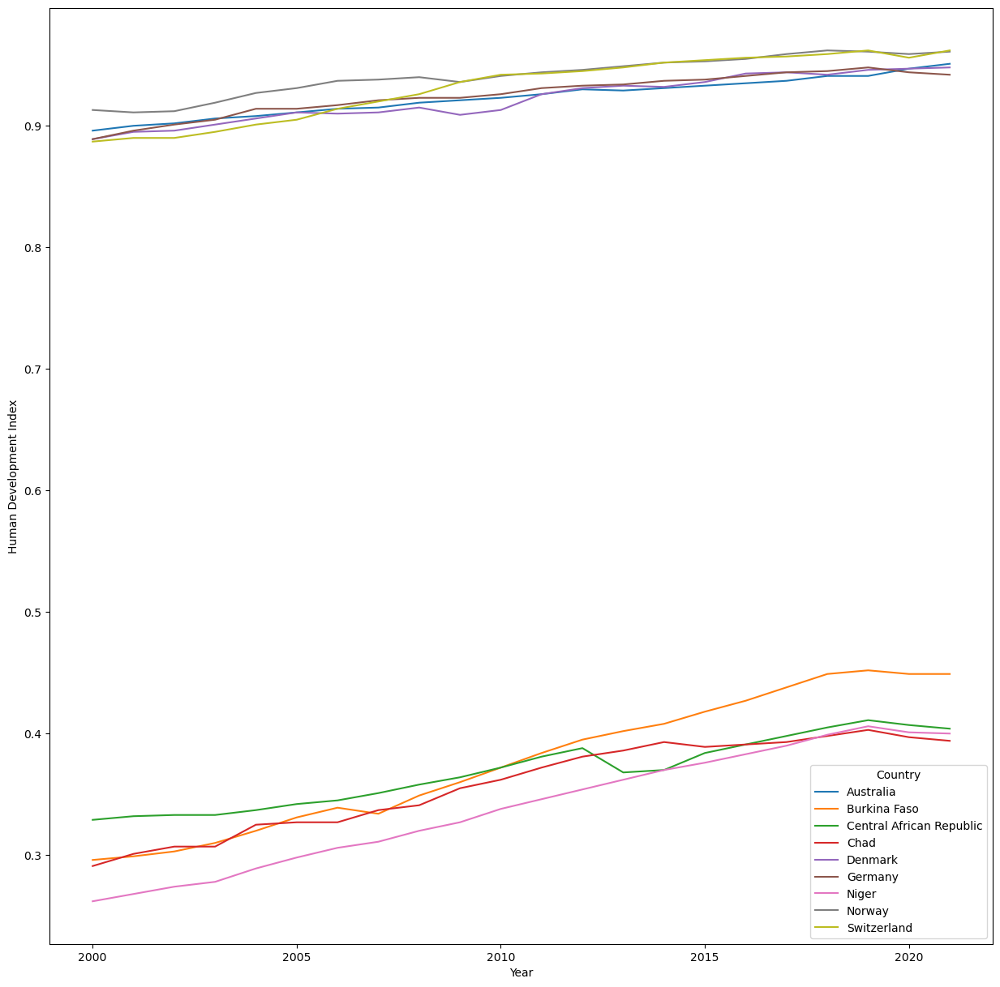

In [105]:
plt.figure(figsize=(15,15))
sns.lineplot(data=df_top_countries, x= 'Year', y= 'Human Development Index',hue= 'Country',err_kws = None)

#buscara en chat gpt como hacer grafico solo con los 5 maiores y 5 menores, incluido os 10 numa lista

<AxesSubplot:xlabel='Human Development Index', ylabel='Adolescent Birth Rate'>

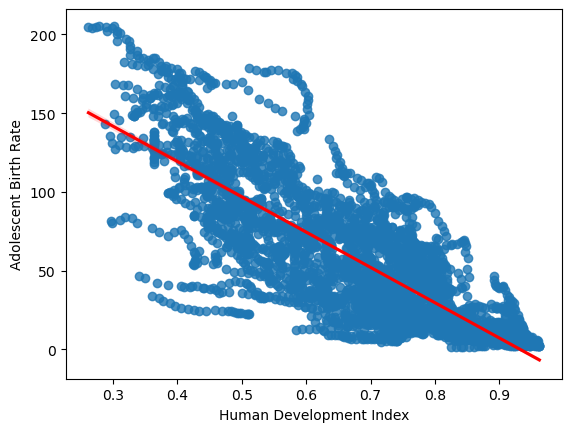

In [106]:
sns.regplot(data=df_new, x="Human Development Index",y="Adolescent Birth Rate",line_kws= {'color':'red'})


<AxesSubplot:xlabel='Human Development Index', ylabel='Adolescent Birth Rate'>

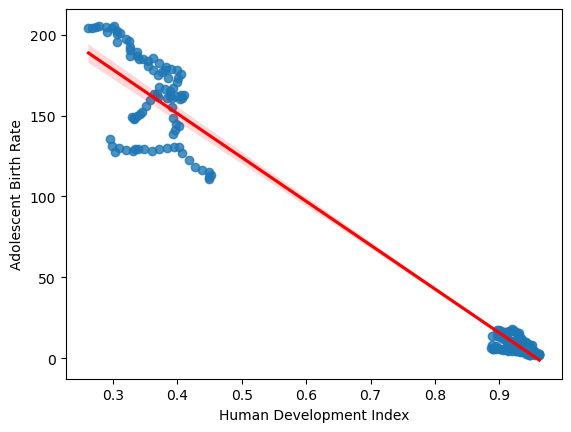

In [107]:
sns.regplot(data=df_top_countries, x="Human Development Index",y="Adolescent Birth Rate",line_kws= {'color':'red'})


In [108]:
import plotly.express as px

# Create the line plot
fig = px.line(df_top_countries, x='Year', y='Human Development Index', color='Country')
fig.show()


In [109]:
px.strip(df_new, x="Maternal Mortality Rate")

In [110]:
px.strip(df_new, x="Human Development Index", color="Continent", hover_name="Country")

#delimitar por años

In [111]:


# Supongamos que tu DataFrame tiene una columna llamada 'año'
# Puedes cambiar el nombre de la columna según tu conjunto de datos
fig = px.strip(df_new, x="Human Development Index", color="Continent", hover_name="Country", animation_frame="Year")

# Ajusta el diseño y muestra la figura
fig.update_layout(title="Desarrollo Humano de 2000 a 2021")
fig.show()



In [112]:
px.histogram(df_new, x="Human Development Index", color="Continent", hover_name="Country")

In [113]:
px.histogram(df_new, x="Adolescent Birth Rate", color="Continent", hover_name="Country", marginal="rug")

In [114]:
df_europa = df_new[df_new.Continent=='Europa']

In [115]:
px.histogram(df_europa, y="Life Expectancy at Birth", x="Country", hover_name="Country", marginal="rug",histfunc="avg")

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

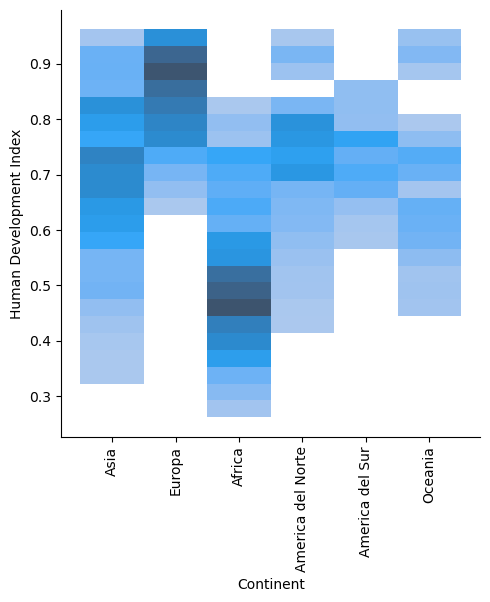

In [116]:
sns.displot(df_new, x = "Continent" , y = "Human Development Index")

plt.xticks(rotation=90)

In [117]:
px.histogram(df_new, x="Life Expectancy at Birth", y="Country", color="Continent", hover_name="Country", marginal="rug")

#puedo seleccionar los paises con menor y mayor indice y trazar paralelos"

In [118]:
px.histogram(df_new, x="Female Share of Seats in Parliament", y="Country", color="Continent", hover_name="Country", marginal="rug")


In [119]:
px.histogram(df_new, x="Female Share of Seats in Parliament", y="Human Development Index", color="Continent", hover_name="Country", marginal="rug", facet_col="Continent")

Columns : 'Country', 'Continent', 'Year', 'Adolescent Birth Rate', 'co_prod_', 'Expected Years of Schooling', 'Expected Years of Schooling for Females','Gross National Income per capita', 'Human Development Index', 'Life Expectancy at Birth', 'Females Life Expectancy at Birth', 'Maternal Mortality Rate', 'Mean Years of Schooling', 'Participation Rate of Females in the Labor Force', 'Female Share of Seats in Parliament']

In [120]:
px.histogram(df_new, x="Human Development Index", y="Female Share of Seats in Parliament", color="Continent", hover_name="Country", marginal="rug", facet_col="Continent")

In [121]:
px.bar(df_new, color="Gross National Income per capita", x="Human Development Index", y="Continent", hover_name="Country" )

#por que no funciona?

In [122]:
px.sunburst(df_new, color="co_prod_", values="Human Development Index", path=["Continent","Country"], hover_name="Country" )

In [123]:
px.sunburst(df_new, color="Gross National Income per capita", values="Human Development Index", path=["Continent","Country"], hover_name="Country" )

In [124]:
px.treemap(df_new, color="Participation Rate of Females in the Labor Force", values="Human Development Index", path=["Continent","Country"], hover_name="Country",height=600 )

In [125]:
px.choropleth(df_new, color="Human Development Index", locations="Continent", hover_name="Continent",height=400 )

In [126]:
px.scatter(df_new, x="Mean Years of Schooling", y="Human Development Index", hover_name="Country", color="Continent")

In [127]:
df_new.isnull().sum()

Country                                             0
Continent                                           0
Year                                                0
Adolescent Birth Rate                               0
co_prod_                                            0
Expected Years of Schooling                         0
Expected Years of Schooling for Females             0
Gross National Income per capita                    0
Human Development Index                             0
Life Expectancy at Birth                            0
Females Life Expectancy at Birth                    0
Maternal Mortality Rate                             0
Mean Years of Schooling                             0
Participation Rate of Females in the Labor Force    0
Female Share of Seats in Parliament                 0
dtype: int64

In [128]:
px.scatter(df_new, x="Mean Years of Schooling", y="Human Development Index", hover_name="Country", color="Continent", size="Gross National Income per capita" )


In [129]:
px.scatter(df_new, y="Mean Years of Schooling", x="Human Development Index", hover_name="Country", color="Continent", size="Gross National Income per capita" )


In [130]:


px.scatter(df_europa, y="Mean Years of Schooling", x="Human Development Index", hover_name="Country", color="Country", size="Gross National Income per capita" )


In [131]:


px.scatter(df_europa, y="Mean Years of Schooling", x="Year", hover_name="Country", color="Country", size="Gross National Income per capita" )


In [132]:

px.scatter(df_europa, y="Female Share of Seats in Parliament", x="Human Development Index", hover_name="Country", color="Country", size="Gross National Income per capita" )


In [133]:

px.scatter(df_europa, y="Female Share of Seats in Parliament", x="Year", hover_name="Country", color="Country", size="Gross National Income per capita" )


Pre procesado para Clustering

In [134]:

from sklearn.preprocessing import LabelEncoder, StandardScaler

In [135]:
label = LabelEncoder()

In [136]:
df_trans = df_new.copy()

In [137]:
df_trans.Country = label.fit_transform(df_trans.Country)

In [138]:
label.classes_

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon',
       'Canada', 'Central African Republic', 'Chad', 'Chile', 'China',
       'Colombia', 'Comoros', 'Congo',
       'Congo (Democratic Republic of the)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini (Kingdom of)', 'Ethiopia', 'Fiji', 'Finland', 'France',
       'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece',
     

In [139]:
df_trans.head()

,Country,Continent,Year,Adolescent Birth Rate,co_prod_,Expected Years of Schooling,Expected Years of Schooling for Females,Gross National Income per capita,Human Development Index,Life Expectancy at Birth,Females Life Expectancy at Birth,Maternal Mortality Rate,Mean Years of Schooling,Participation Rate of Females in the Labor Force,Female Share of Seats in Parliament
10,0,Asia,2000,152.572,0.036462,5.52905,3.662762,984.997434,0.335,55.2978,56.8579,1450.0,1.407806,25.925926,1.367468
11,0,Asia,2001,150.863,0.036931,5.83155,3.896981,894.024589,0.337,55.7981,57.3437,1390.0,1.465161,25.925926,1.476500
12,0,Asia,2002,148.141,0.046529,6.13405,4.146178,1267.628852,0.362,56.4538,57.6715,1300.0,1.522516,25.925926,1.585532
13,0,Asia,2003,143.370,0.050083,6.43655,4.411310,1401.324413,0.376,57.3445,58.6498,1240.0,1.579871,25.925926,1.694564
14,0,Asia,2004,138.827,0.035960,7.39388,4.137720,1384.695729,0.392,57.9436,59.2159,1180.0,1.637226,25.925926,1.803596


In [140]:
df_trans.Continent = label.fit_transform(df_trans.Continent)

In [141]:
standard = StandardScaler()

In [142]:
df_trans.columns

Index(['Country', 'Continent', 'Year', 'Adolescent Birth Rate', 'co_prod_',
       'Expected Years of Schooling',
       'Expected Years of Schooling for Females',
       'Gross National Income per capita', 'Human Development Index',
       'Life Expectancy at Birth', 'Females Life Expectancy at Birth',
       'Maternal Mortality Rate', 'Mean Years of Schooling',
       'Participation Rate of Females in the Labor Force',
       'Female Share of Seats in Parliament'],
      dtype='object')

In [143]:
numeric = [ 'Adolescent Birth Rate', 'co_prod_',
       'Expected Years of Schooling',
       'Expected Years of Schooling for Females',
       'Gross National Income per capita', 'Human Development Index',
       'Life Expectancy at Birth', 'Females Life Expectancy at Birth',
       'Maternal Mortality Rate', 'Mean Years of Schooling',
       'Participation Rate of Females in the Labor Force',
       'Female Share of Seats in Parliament']

In [144]:
df_trans[numeric]= standard.fit_transform(df_trans[numeric])

In [145]:
df_trans.head()

,Country,Continent,Year,Adolescent Birth Rate,co_prod_,Expected Years of Schooling,Expected Years of Schooling for Females,Gross National Income per capita,Human Development Index,Life Expectancy at Birth,Females Life Expectancy at Birth,Maternal Mortality Rate,Mean Years of Schooling,Participation Rate of Females in the Labor Force,Female Share of Seats in Parliament
10,0,3,2000,2.193550,-0.732189,-2.208899,-1.636056,-0.874150,-2.184075,-1.620647,-1.660207,4.342405,-2.034151,0.678492,-1.584535
11,0,3,2001,2.154826,-0.732114,-2.114007,-1.594020,-0.879057,-2.171541,-1.564238,-1.607916,4.134606,-2.016546,0.678492,-1.581073
12,0,3,2002,2.093148,-0.730571,-2.019114,-1.549296,-0.858905,-2.014867,-1.490308,-1.572632,3.822908,-1.998940,0.678492,-1.577611
13,0,3,2003,1.985041,-0.729999,-1.924222,-1.501713,-0.851693,-1.927130,-1.389881,-1.467328,3.615109,-1.981335,0.678492,-1.574148
14,0,3,2004,1.882101,-0.732270,-1.623913,-1.550814,-0.852590,-1.826860,-1.322333,-1.406394,3.407310,-1.963729,0.678492,-1.570686


In [146]:
import seaborn as sns; 
sns.set(rc = {"scatter.edgecolors":"k", 'figure.figsize': (15, 9)}) 

Modelo 

In [147]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, random_state=4)
#lo entrenamos 
kmeans.fit(df_trans)
y_kmeans = kmeans.predict(df_trans)


In [148]:
df_new['cluster'] = y_kmeans

In [149]:
df_new.head()

,Country,Continent,Year,Adolescent Birth Rate,co_prod_,Expected Years of Schooling,Expected Years of Schooling for Females,Gross National Income per capita,Human Development Index,Life Expectancy at Birth,Females Life Expectancy at Birth,Maternal Mortality Rate,Mean Years of Schooling,Participation Rate of Females in the Labor Force,Female Share of Seats in Parliament,cluster
10,Afghanistan,Asia,2000,152.572,0.036462,5.52905,3.662762,984.997434,0.335,55.2978,56.8579,1450.0,1.407806,25.925926,1.367468,0
11,Afghanistan,Asia,2001,150.863,0.036931,5.83155,3.896981,894.024589,0.337,55.7981,57.3437,1390.0,1.465161,25.925926,1.476500,0
12,Afghanistan,Asia,2002,148.141,0.046529,6.13405,4.146178,1267.628852,0.362,56.4538,57.6715,1300.0,1.522516,25.925926,1.585532,0
13,Afghanistan,Asia,2003,143.370,0.050083,6.43655,4.411310,1401.324413,0.376,57.3445,58.6498,1240.0,1.579871,25.925926,1.694564,0
14,Afghanistan,Asia,2004,138.827,0.035960,7.39388,4.137720,1384.695729,0.392,57.9436,59.2159,1180.0,1.637226,25.925926,1.803596,0


In [150]:
df_new.cluster.value_counts()

0    1408
1    1386
2    1386
Name: cluster, dtype: int64

Text(0.5, 0, 'Expected Years of Schooling')

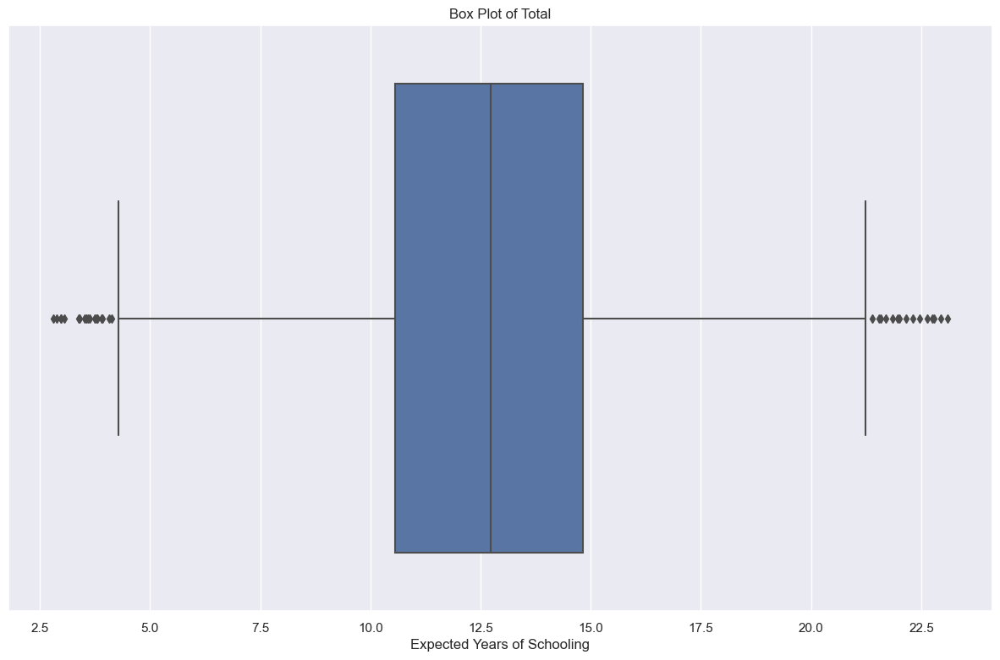

In [151]:
g = sns.boxplot(data = df_new, x = 'Expected Years of Schooling')

# Add a title and change xlabel
g.set_title('Box Plot of Total')
g.set_xlabel('Expected Years of Schooling')

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

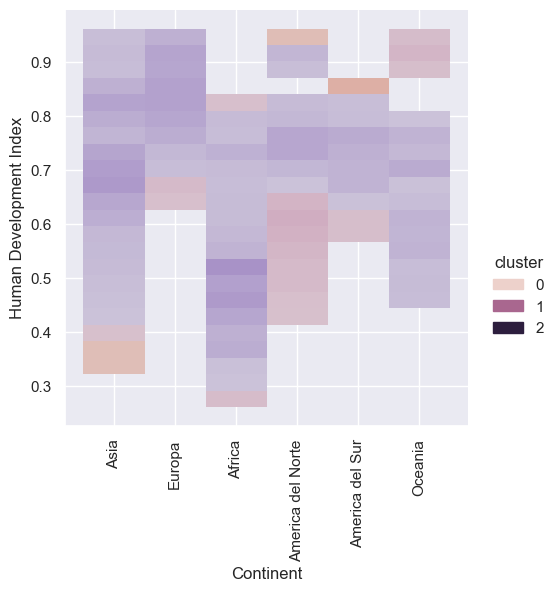

In [152]:
sns.displot(df_new, x = "Continent" , y = "Human Development Index", hue = "cluster")

plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

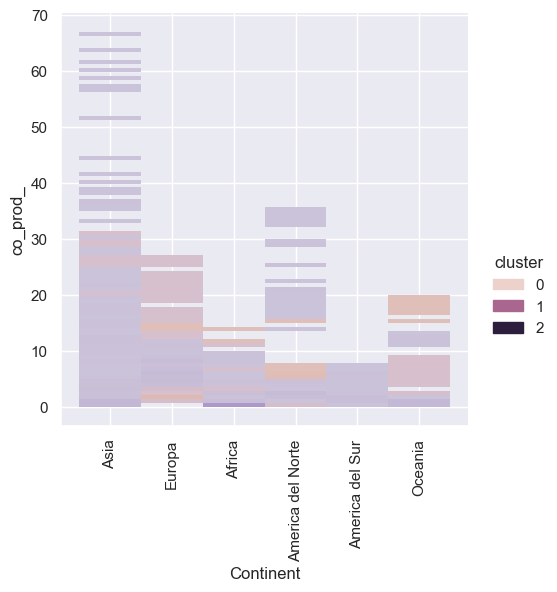

In [153]:
sns.displot(df_new, x = "Continent" , y = "co_prod_", hue = "cluster")

plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

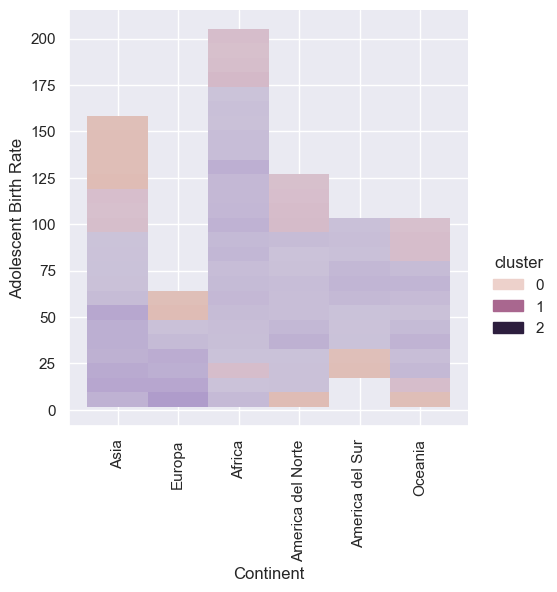

In [154]:
sns.displot(df_new, x = "Continent" , y = "Adolescent Birth Rate", hue = "cluster")

plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

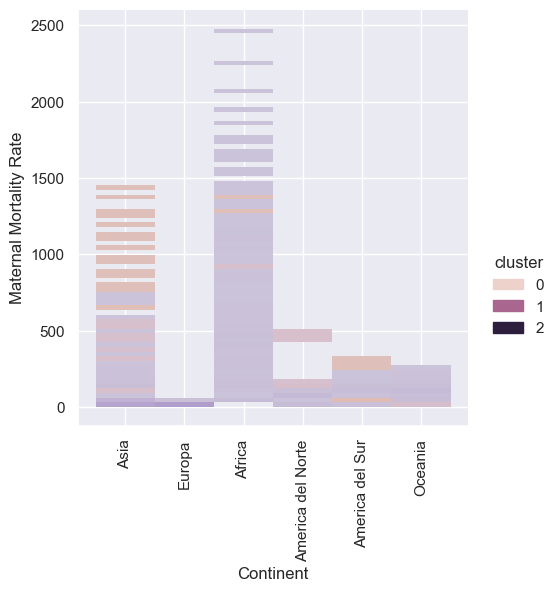

In [155]:
sns.displot(df_new, x = "Continent" , y = "Maternal Mortality Rate", hue = "cluster")

plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

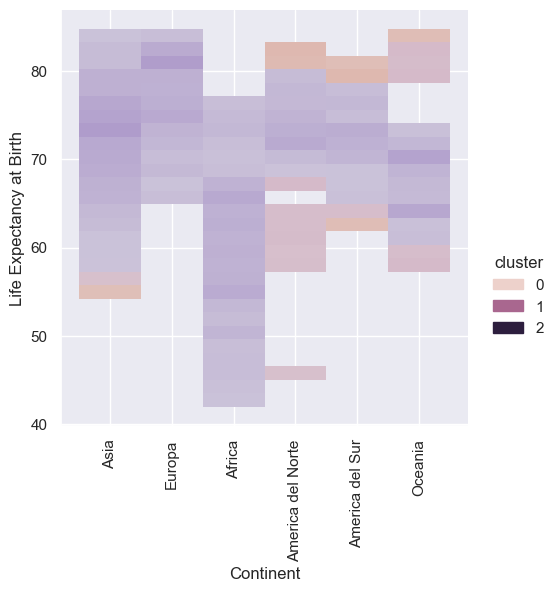

In [156]:
sns.displot(df_new, x = "Continent" , y = "Life Expectancy at Birth", hue = "cluster")

plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

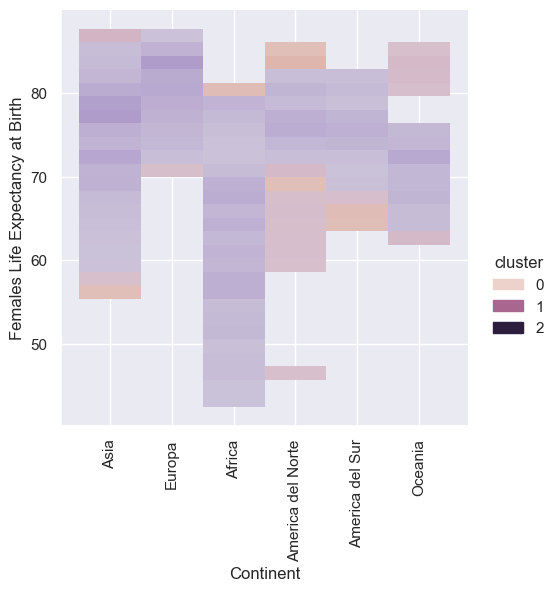

In [157]:


sns.displot(df_new, x = "Continent" , y = "Females Life Expectancy at Birth", hue = "cluster")

plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

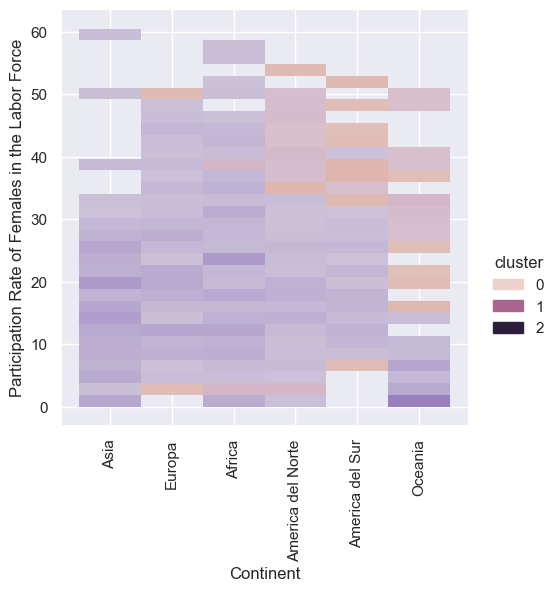

In [158]:
sns.displot(df_new, x = "Continent" , y = "Participation Rate of Females in the Labor Force", hue = "cluster")

plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

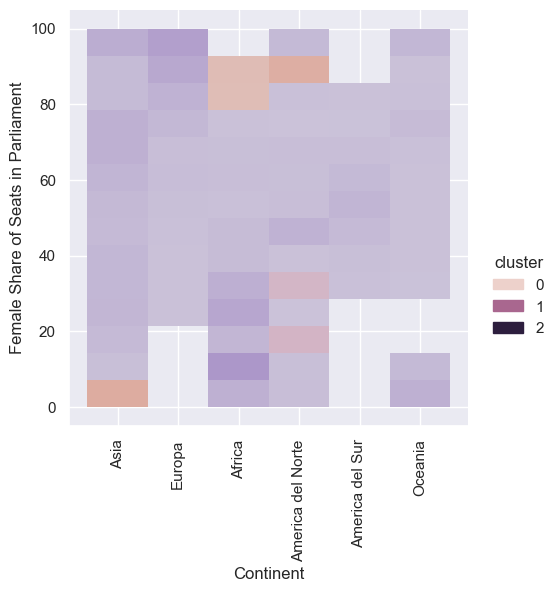

In [159]:
sns.displot(df_new, x = "Continent" , y = "Female Share of Seats in Parliament", hue = "cluster")

plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

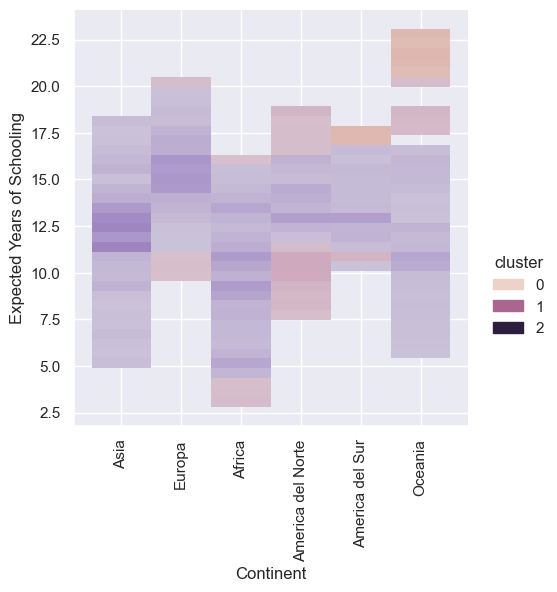

In [160]:
sns.displot(df_new, x = "Continent" , y = "Expected Years of Schooling", hue = "cluster")

plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

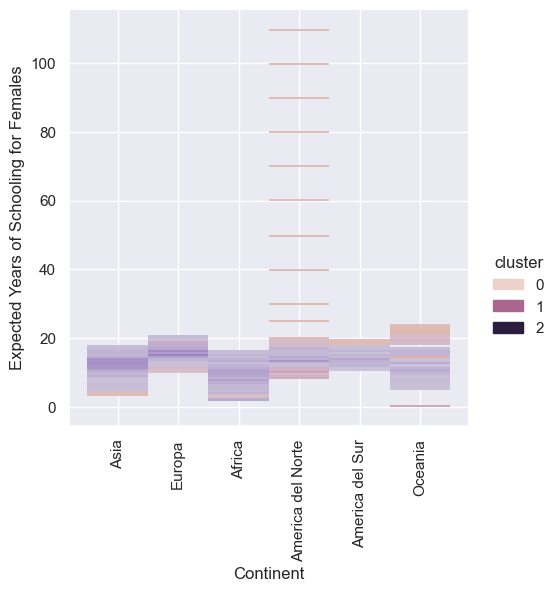

In [161]:
sns.displot(df_new, x = "Continent" , y = "Expected Years of Schooling for Females", hue = "cluster")

plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

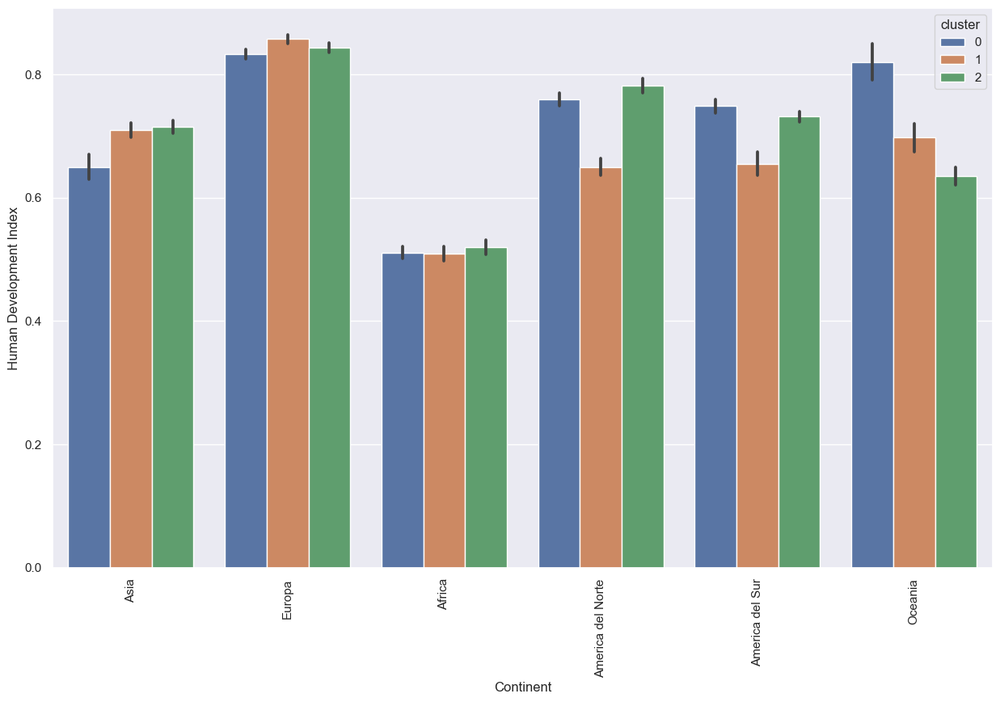

In [162]:
sns.barplot(data = df_new, x = "Continent" , y = "Human Development Index" , hue = "cluster")

plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

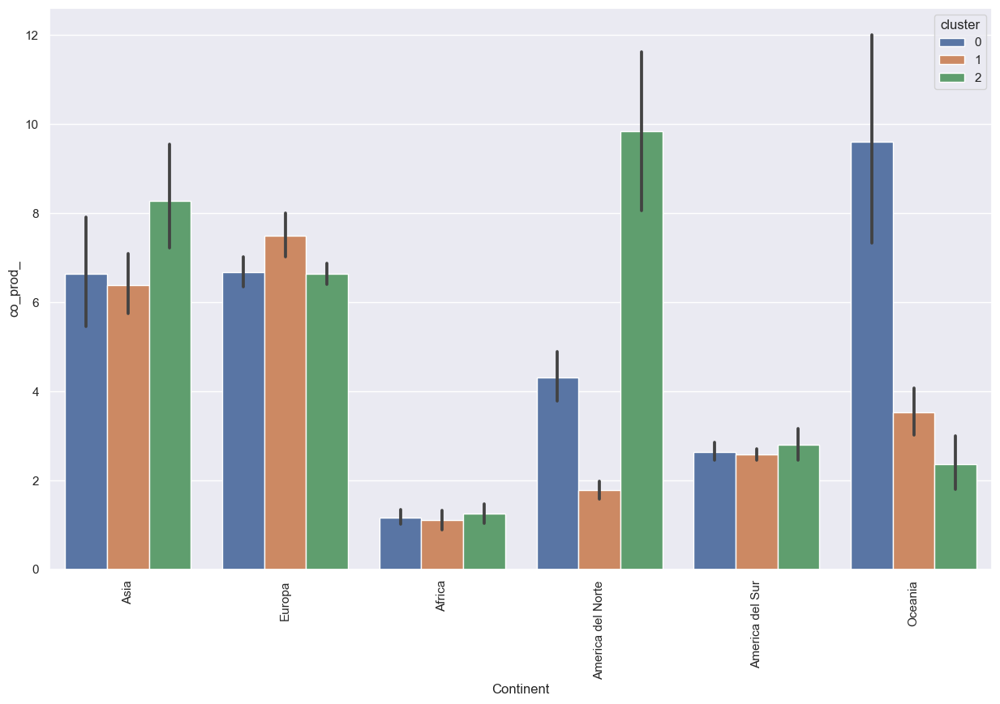

In [163]:


sns.barplot(data = df_new, x = "Continent" , y = 'co_prod_' , hue = "cluster")

plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

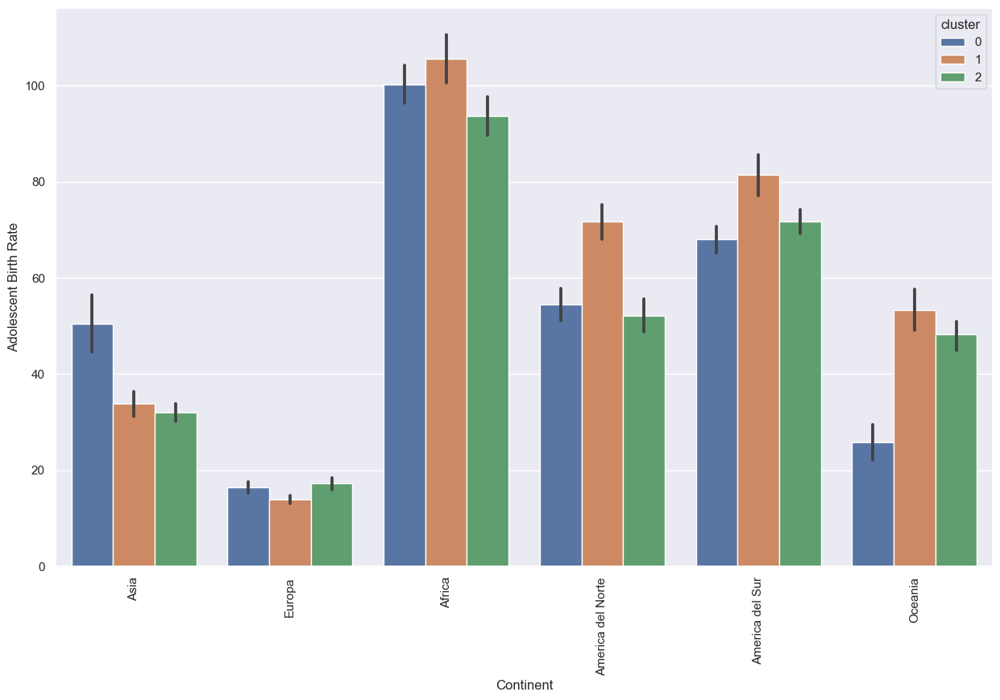

In [164]:
sns.barplot(data = df_new, x = "Continent" , y = "Adolescent Birth Rate" , hue = "cluster")

plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

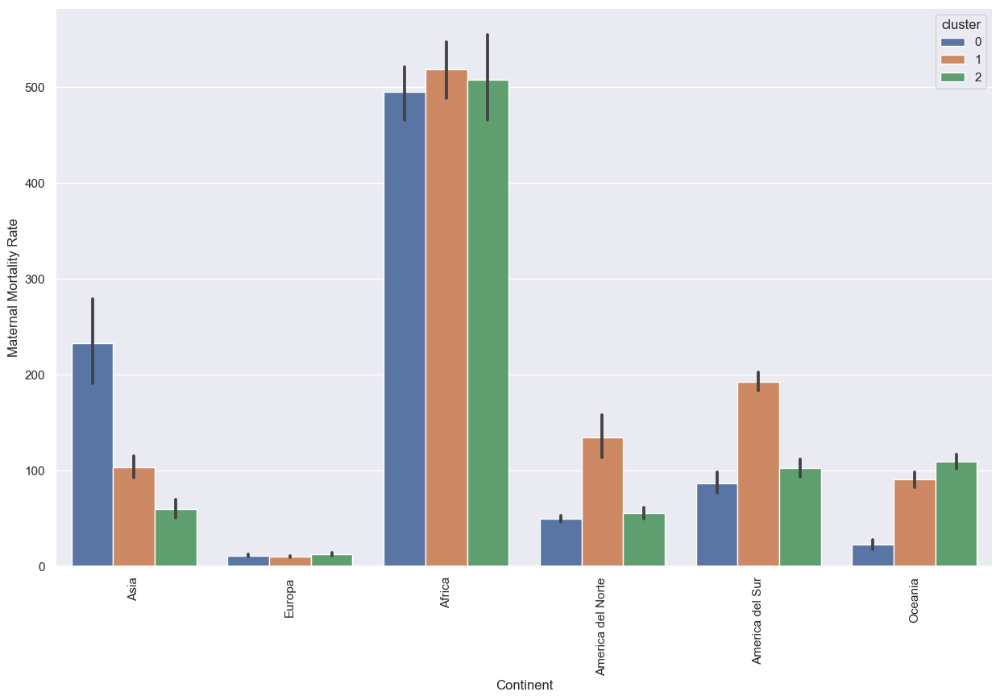

In [165]:
sns.barplot(data = df_new, x = "Continent" , y = "Maternal Mortality Rate" , hue = "cluster")

plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

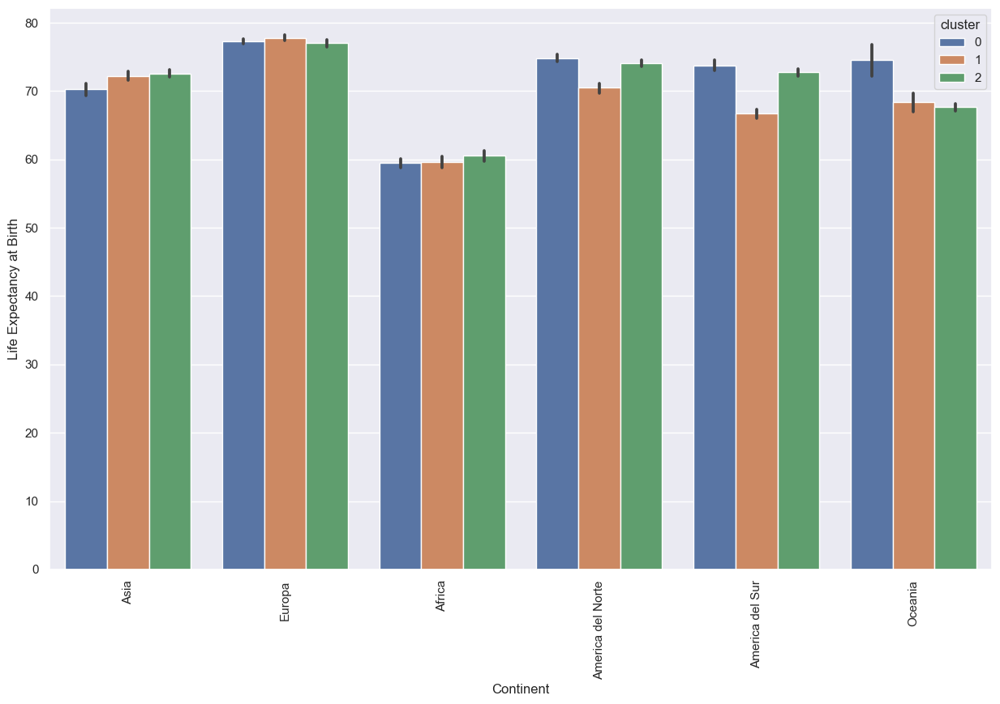

In [166]:


sns.barplot(data = df_new, x = "Continent" , y = 'Life Expectancy at Birth' , hue = "cluster")

plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

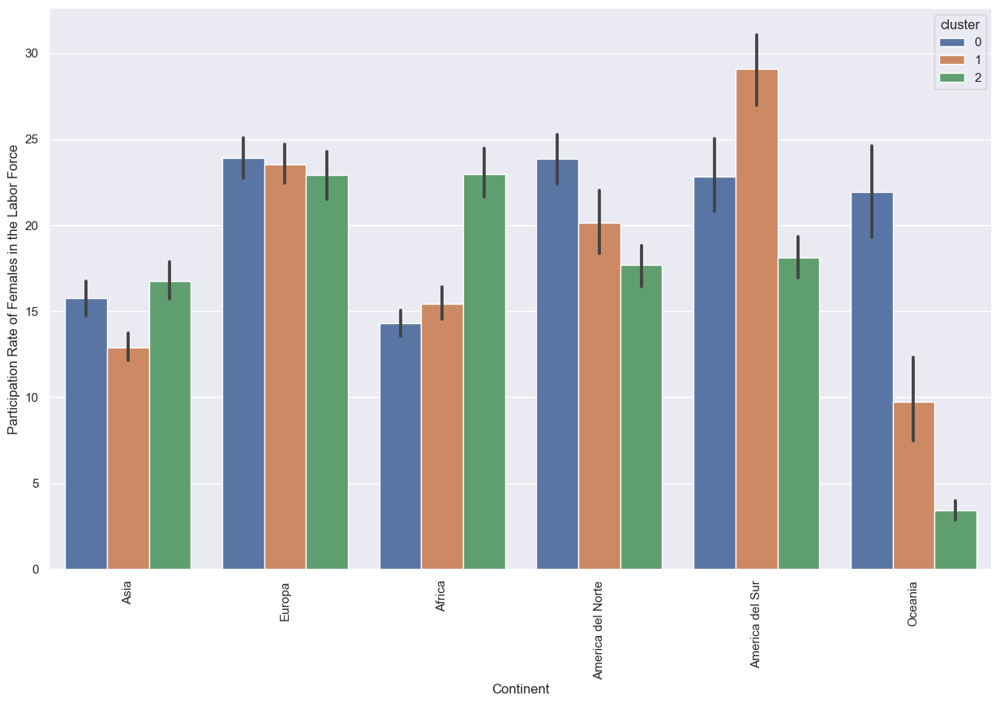

In [167]:
sns.barplot(data = df_new, x = "Continent" , y = "Participation Rate of Females in the Labor Force" , hue = "cluster")

plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

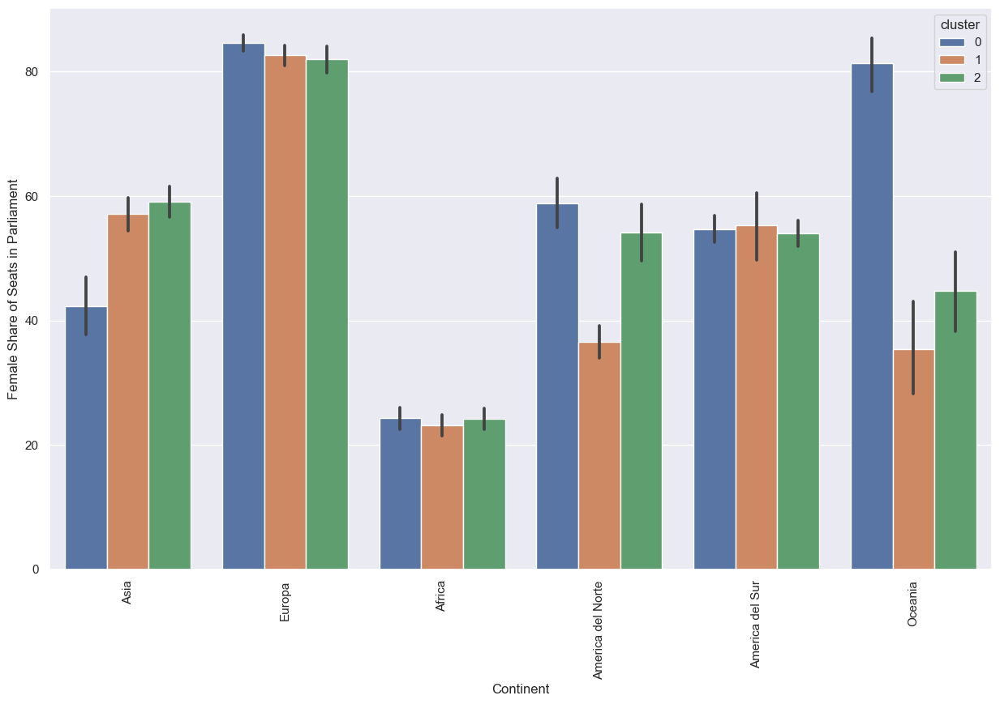

In [168]:



sns.barplot(data = df_new, x = "Continent" , y = 'Female Share of Seats in Parliament' , hue = "cluster")

plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europa'),
  Text(2, 0, 'Africa'),
  Text(3, 0, 'America del Norte'),
  Text(4, 0, 'America del Sur'),
  Text(5, 0, 'Oceania')])

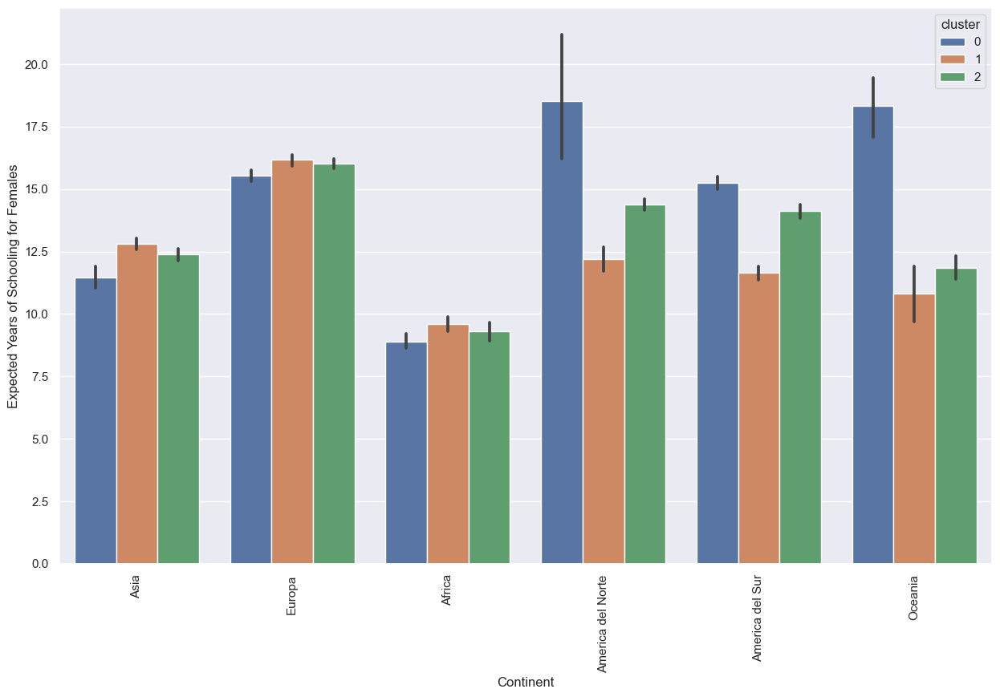

In [169]:


sns.barplot(data = df_new, x = "Continent" , y = 'Expected Years of Schooling for Females' , hue = "cluster")

plt.xticks(rotation=90)

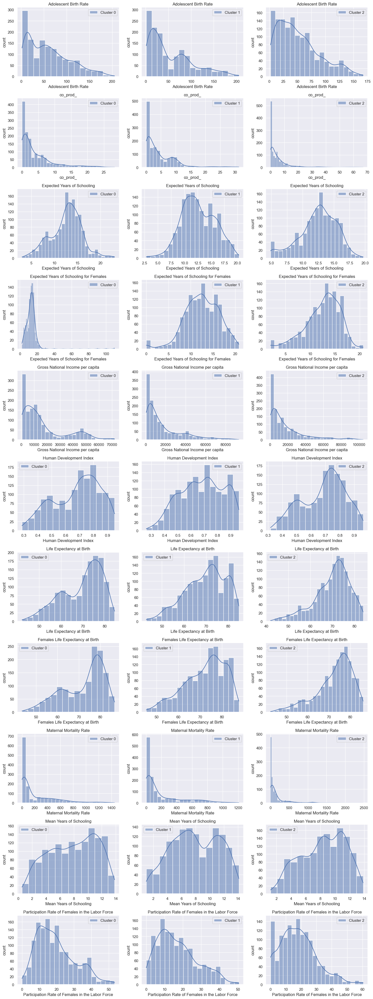

In [170]:
#ejemplo Alana

fig, axes = plt.subplots(11, 3, figsize=(15, 40))

for i, variable in enumerate(numeric):
    for j, cluster in enumerate(df_new['cluster'].unique()):
        cluster_data = df_new[df_new['cluster'] == cluster]
        if i < 11 and j < 3: 
            sns.histplot(data=cluster_data, x=variable, kde=True, label=f'Cluster {cluster}', ax=axes[i, j])
            #px.histogram(data_frame=df_new, x = variable, marginal= "kde",)
            
            axes[i, j].set_ylabel('count')
            axes[i, j].set_title(variable)
            axes[i, j].legend()
            
        
plt.tight_layout()

/Users/paulamoreira/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='Continent', ylabel='count'>

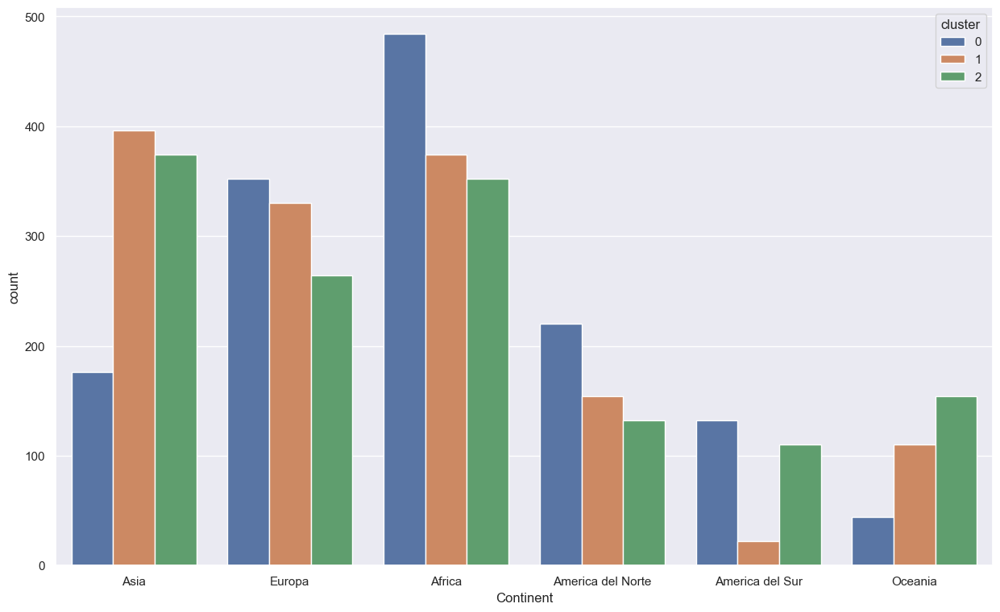

In [171]:
sns.countplot(df_new.Continent, hue = df_new.cluster)

Pre procesado para supervisado

In [172]:

from sklearn.preprocessing import LabelEncoder, StandardScaler

In [173]:
label = LabelEncoder()

In [174]:
df_sup = df_new.copy()

In [175]:
df_sup.Country = label.fit_transform(df_sup.Country)

In [176]:
label.classes_

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon',
       'Canada', 'Central African Republic', 'Chad', 'Chile', 'China',
       'Colombia', 'Comoros', 'Congo',
       'Congo (Democratic Republic of the)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini (Kingdom of)', 'Ethiopia', 'Fiji', 'Finland', 'France',
       'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece',
     

In [177]:
df_sup.head()

,Country,Continent,Year,Adolescent Birth Rate,co_prod_,Expected Years of Schooling,Expected Years of Schooling for Females,Gross National Income per capita,Human Development Index,Life Expectancy at Birth,Females Life Expectancy at Birth,Maternal Mortality Rate,Mean Years of Schooling,Participation Rate of Females in the Labor Force,Female Share of Seats in Parliament,cluster
10,0,Asia,2000,152.572,0.036462,5.52905,3.662762,984.997434,0.335,55.2978,56.8579,1450.0,1.407806,25.925926,1.367468,0
11,0,Asia,2001,150.863,0.036931,5.83155,3.896981,894.024589,0.337,55.7981,57.3437,1390.0,1.465161,25.925926,1.476500,0
12,0,Asia,2002,148.141,0.046529,6.13405,4.146178,1267.628852,0.362,56.4538,57.6715,1300.0,1.522516,25.925926,1.585532,0
13,0,Asia,2003,143.370,0.050083,6.43655,4.411310,1401.324413,0.376,57.3445,58.6498,1240.0,1.579871,25.925926,1.694564,0
14,0,Asia,2004,138.827,0.035960,7.39388,4.137720,1384.695729,0.392,57.9436,59.2159,1180.0,1.637226,25.925926,1.803596,0


In [178]:
df_sup.Continent = label.fit_transform(df_sup.Continent)

In [179]:
standard = StandardScaler()

In [180]:
df_sup.columns

Index(['Country', 'Continent', 'Year', 'Adolescent Birth Rate', 'co_prod_',
       'Expected Years of Schooling',
       'Expected Years of Schooling for Females',
       'Gross National Income per capita', 'Human Development Index',
       'Life Expectancy at Birth', 'Females Life Expectancy at Birth',
       'Maternal Mortality Rate', 'Mean Years of Schooling',
       'Participation Rate of Females in the Labor Force',
       'Female Share of Seats in Parliament', 'cluster'],
      dtype='object')

In [181]:
numeric = [ 'Adolescent Birth Rate', 'co_prod_',
       'Expected Years of Schooling',
       'Expected Years of Schooling for Females',
       'Gross National Income per capita',
       'Life Expectancy at Birth', 'Females Life Expectancy at Birth',
       'Maternal Mortality Rate', 'Mean Years of Schooling',
       'Participation Rate of Females in the Labor Force',
       'Female Share of Seats in Parliament']

In [182]:
df_sup[numeric]= standard.fit_transform(df_sup[numeric])

In [183]:
df_sup.head()

,Country,Continent,Year,Adolescent Birth Rate,co_prod_,Expected Years of Schooling,Expected Years of Schooling for Females,Gross National Income per capita,Human Development Index,Life Expectancy at Birth,Females Life Expectancy at Birth,Maternal Mortality Rate,Mean Years of Schooling,Participation Rate of Females in the Labor Force,Female Share of Seats in Parliament,cluster
10,0,3,2000,2.193550,-0.732189,-2.208899,-1.636056,-0.874150,0.335,-1.620647,-1.660207,4.342405,-2.034151,0.678492,-1.584535,0
11,0,3,2001,2.154826,-0.732114,-2.114007,-1.594020,-0.879057,0.337,-1.564238,-1.607916,4.134606,-2.016546,0.678492,-1.581073,0
12,0,3,2002,2.093148,-0.730571,-2.019114,-1.549296,-0.858905,0.362,-1.490308,-1.572632,3.822908,-1.998940,0.678492,-1.577611,0
13,0,3,2003,1.985041,-0.729999,-1.924222,-1.501713,-0.851693,0.376,-1.389881,-1.467328,3.615109,-1.981335,0.678492,-1.574148,0
14,0,3,2004,1.882101,-0.732270,-1.623913,-1.550814,-0.852590,0.392,-1.322333,-1.406394,3.407310,-1.963729,0.678492,-1.570686,0


In [184]:
df_sup.drop('cluster',axis=1, inplace=True)

In [185]:
import seaborn as sns; 
sns.set(rc = {"scatter.edgecolors":"k", 'figure.figsize': (15, 9)}) 

Outliers con Z-score

In [186]:
# Import zscore function
from scipy.stats import zscore

# Calculate z-score for each data point and compute its absolute value
z_scores = zscore(df_new['Expected Years of Schooling'])
abs_z_scores = np.abs(z_scores)

# Select the outliers using a threshold of 3
outliers = df_new[abs_z_scores > 3]
outliers.head()

,Country,Continent,Year,Adolescent Birth Rate,co_prod_,Expected Years of Schooling,Expected Years of Schooling for Females,Gross National Income per capita,Human Development Index,Life Expectancy at Birth,Females Life Expectancy at Birth,Maternal Mortality Rate,Mean Years of Schooling,Participation Rate of Females in the Labor Force,Female Share of Seats in Parliament,cluster
275,Australia,Oceania,2009,17.408,18.450832,22.161857,22.523390,42644.38741,0.921,81.7661,84.0268,5.0,11.98708,30.088496,92.241539,0
276,Australia,Oceania,2010,16.622,18.259493,22.316368,22.683522,42840.45928,0.923,82.0550,84.2336,5.0,12.03444,28.318584,93.351501,0
277,Australia,Oceania,2011,15.981,17.984909,22.470878,22.843654,44205.31566,0.926,82.1336,84.2919,6.0,12.11584,29.203540,93.741737,0
278,Australia,Oceania,2012,15.709,17.580628,22.625389,23.003785,44878.41764,0.930,82.3456,84.3471,6.0,12.29574,29.203540,94.278221,0
279,Australia,Oceania,2013,15.059,16.906991,22.779899,23.163917,45260.60917,0.929,82.6041,84.6751,6.0,12.01886,31.111111,91.077942,0


Evaluar :: Elegir numero de clusters utilizando elbow method

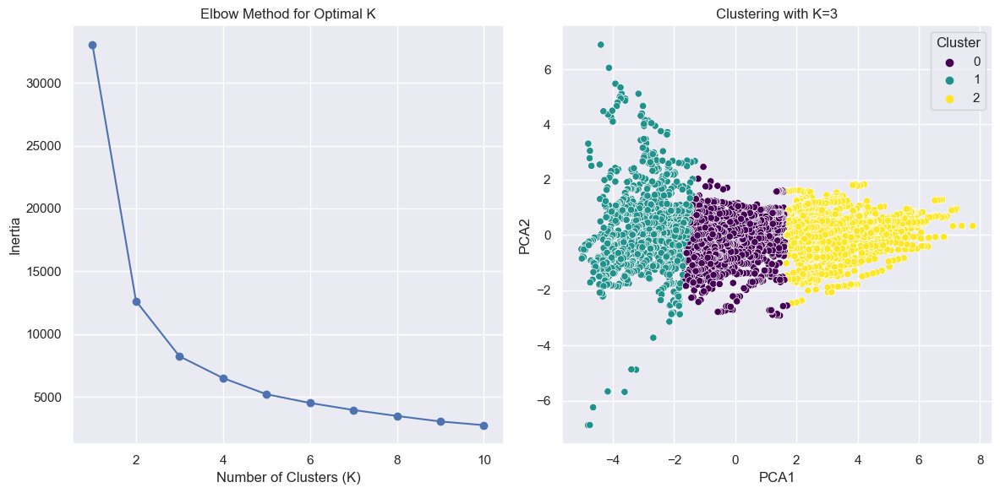

In [187]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np

# Select the numeric variables for PCA
data_for_pca = df_new[numeric]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_for_pca)

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Add the PCA components to the DataFrame
df_new['PCA1'] = pca_result[:, 0]
df_new['PCA2'] = pca_result[:, 1]

# Range of clusters to consider
k_values = range(1, 11)

# Initialize an empty list to store inertia values
inertia_values = []

# Iterate over different values of k
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_new[['PCA1', 'PCA2']])
    inertia_values.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(12, 6))

# Plotting the elbow curve
plt.subplot(1, 2, 1)
plt.plot(k_values, inertia_values, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')

# Plotting the scatter plot with optimal k
plt.subplot(1, 2, 2)
optimal_k = 3  # Adjust based on the visual inspection of the elbow plot
kmeans_optimal = KMeans(n_clusters=optimal_k, random_state=42)
df_new['Cluster'] = kmeans_optimal.fit_predict(df_new[['PCA1', 'PCA2']])
sns.scatterplot(data=df_new, x='PCA1', y='PCA2', hue='Cluster', palette='viridis')
plt.title(f'Clustering with K={optimal_k}')

plt.tight_layout()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

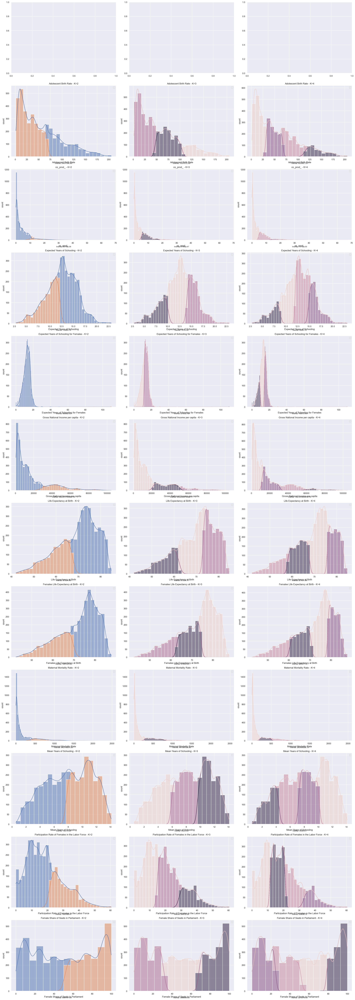

In [188]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# Assuming df_new is your DataFrame and numeric is the list of numeric variables

# Set up the subplots
fig, axes = plt.subplots(12, 3, figsize=(25, 70))

# Variable index starts from 1
for i, variable in enumerate(numeric, start=1):
    # Cluster index starts from 0
    unique_clusters = df_new['cluster'].nunique()
    for j, k in enumerate(range(2, min(unique_clusters + 2, 8))):  # Adjust the range as needed
        # Fit KMeans with different cluster numbers
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(df_new[[variable]])
        
        # Plot histogram
        sns.histplot(data=df_new, x=variable, kde=True, hue=kmeans.labels_, multiple="stack", ax=axes[i, j])
        axes[i, j].set_ylabel('count')
        axes[i, j].set_title(f'{variable} - K={k}')
        axes[i, j].legend()
        
        # Display the inertia value
        inertia_value = kmeans.inertia_
        axes[i, j].text(0.5, -0.1, f'Inertia: {inertia_value:.2f}', size=10, ha="center", transform=axes[i, j].transAxes)

plt.tight_layout()
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

IndexError: index 11 is out of bounds for axis 0 with size 11

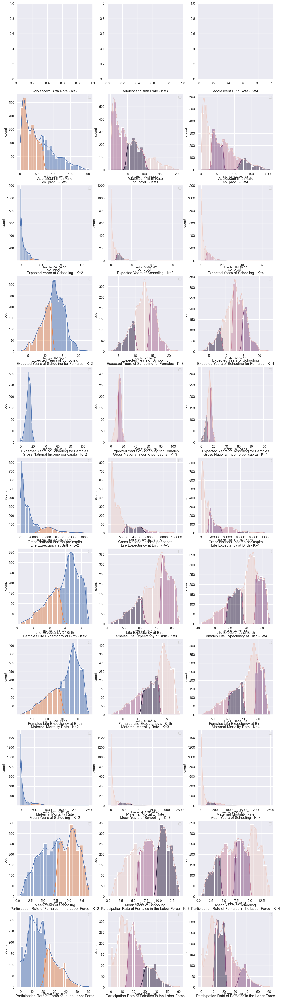

In [189]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# Assuming df_new is your DataFrame and numeric is the list of numeric variables

# Set up the subplots
fig, axes = plt.subplots(11, 3, figsize=(15, 58))

# Variable index starts from 1
for i, variable in enumerate(numeric, start=1):
    # Cluster index starts from 0
    unique_clusters = df_new['cluster'].nunique()
    for j, k in enumerate(range(2, min(unique_clusters + 2, 8))):  # Adjust the range as needed
        # Fit KMeans with different cluster numbers
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(df_new[[variable]])
        
        # Plot histogram
        sns.histplot(data=df_new, x=variable, kde=True, hue=kmeans.labels_, multiple="stack", ax=axes[i, j])
        axes[i, j].set_ylabel('count')
        axes[i, j].set_title(f'{variable} - K={k}')
        axes[i, j].legend()
        
        # Display the inertia value
        inertia_value = kmeans.inertia_
        axes[i, j].text(0.5, -0.1, f'Inertia: {inertia_value:.2f}', size=10, ha="center", transform=axes[i, j].transAxes)

plt.tight_layout()
plt.show()


In [ ]:
df_new.describe()

,Year,Adolescent Birth Rate,co_prod_,Expected Years of Schooling,Expected Years of Schooling for Females,Gross National Income per capita,Human Development Index,Life Expectancy at Birth,Females Life Expectancy at Birth,Maternal Mortality Rate,Mean Years of Schooling,Participation Rate of Females in the Labor Force,Female Share of Seats in Parliament,cluster,PCA1,PCA2,Cluster
count,4180.000000,4180.000000,4180.000000,4180.000000,4180.000000,4180.000000,4180.000000,4180.000000,4180.000000,4180.000000,4180.000000,4180.000000,4180.000000,4180.000000,4.180000e+03,4.180000e+03,4180.000000
mean,2010.500000,55.765146,4.590638,12.570620,12.778706,17191.145942,0.683508,69.671617,72.281704,196.171292,8.034692,18.200516,51.266306,0.994737,6.799452e-18,6.119507e-17,0.874163
std,6.345048,44.137786,6.220689,3.188200,5.572569,18541.549378,0.159587,8.870247,9.291401,288.775155,3.258204,11.387501,31.494919,0.817651,2.624675e+00,1.008333e+00,0.821727
min,2000.000000,1.493000,0.015895,2.803529,0.000000,610.655581,0.262000,41.957200,42.486900,0.000000,0.559420,0.000000,0.000000,0.000000,-5.028057e+00,-6.883862e+00,0.000000
25%,2005.000000,18.188250,0.618371,10.553360,10.280539,3886.109941,0.560000,63.786250,66.233825,15.000000,5.424766,9.580838,22.399550,0.000000,-1.992640e+00,-5.543214e-01,0.000000
50%,2010.500000,44.205500,2.368753,12.727931,12.995339,10438.409555,0.709000,71.506700,74.835150,63.500000,8.227289,16.666667,51.054585,1.000000,-4.261831e-01,2.114586e-02,1.000000
75%,2016.000000,81.612250,6.365988,14.830440,15.281168,23596.455510,0.807000,76.319825,79.306650,260.250000,10.833430,25.000000,80.152193,2.000000,2.045446e+00,5.364504e-01,2.000000
max,2021.000000,205.385000,67.012514,23.088921,110.000000,104640.280700,0.962000,84.783900,87.731300,2480.000000,14.132150,60.500000,100.000000,2.000000,7.764393e+00,6.888983e+00,2.000000


Text(0.5, 0, 'Expected Years of Schooling')

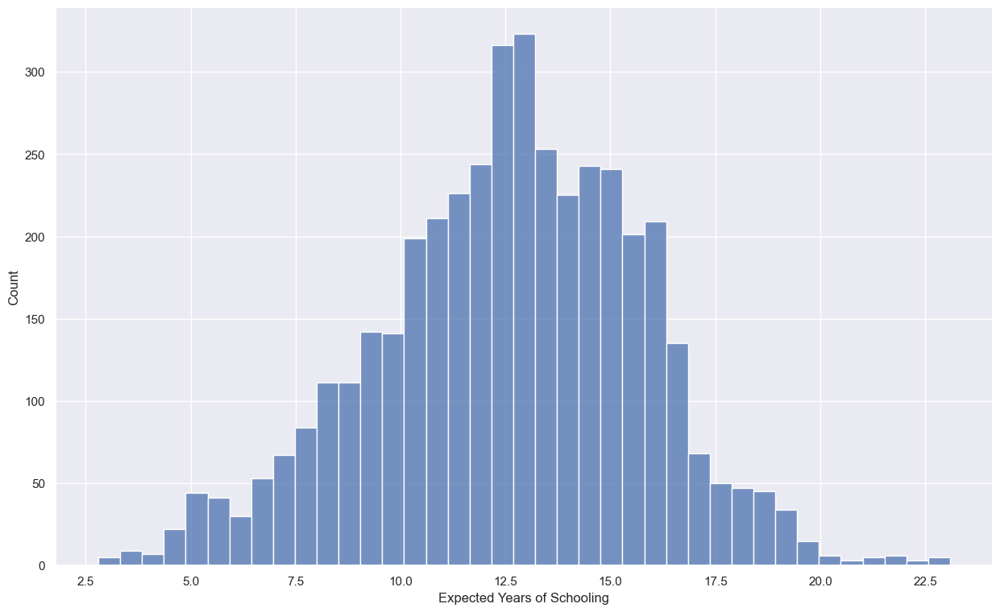

In [ ]:

g = sns.histplot(data = df_new, x = 'Expected Years of Schooling')
# Add labels
g.set_xlabel('Expected Years of Schooling')

In [ ]:
import plotly.express as px

# Assuming df_new is your DataFrame
fig = px.histogram(df_new, x='Expected Years of Schooling', nbins=20, labels={'Expected Years of Schooling': 'Expected Years of Schooling'})

# Update the layout to include hover information
fig.update_layout(hovermode='x unified')

# Show the plot
fig.show()


In [ ]:
#from sklearn.metrics import silhouette_score
#silhouette_avg = silhouette_score(data, labels)


Modelo de predicción

In [191]:
df_sup.head(20)

,Country,Continent,Year,Adolescent Birth Rate,co_prod_,Expected Years of Schooling,Expected Years of Schooling for Females,Gross National Income per capita,Human Development Index,Life Expectancy at Birth,Females Life Expectancy at Birth,Maternal Mortality Rate,Mean Years of Schooling,Participation Rate of Females in the Labor Force,Female Share of Seats in Parliament
10,0,3,2000,2.193550,-0.732189,-2.208899,-1.636056,-0.874150,0.335,-1.620647,-1.660207,4.342405,-2.034151,0.678492,-1.584535
11,0,3,2001,2.154826,-0.732114,-2.114007,-1.594020,-0.879057,0.337,-1.564238,-1.607916,4.134606,-2.016546,0.678492,-1.581073
12,0,3,2002,2.093148,-0.730571,-2.019114,-1.549296,-0.858905,0.362,-1.490308,-1.572632,3.822908,-1.998940,0.678492,-1.577611
13,0,3,2003,1.985041,-0.729999,-1.924222,-1.501713,-0.851693,0.376,-1.389881,-1.467328,3.615109,-1.981335,0.678492,-1.574148
14,0,3,2004,1.882101,-0.732270,-1.623913,-1.550814,-0.852590,0.392,-1.322333,-1.406394,3.407310,-1.963729,0.678492,-1.570686
15,0,3,2005,1.751676,-0.729884,-1.540301,-1.469181,-0.849866,0.400,-1.275294,-1.354651,3.268777,-1.946124,0.678492,-1.567224
16,0,3,2006,1.593856,-0.728104,-1.456690,-1.387548,-0.845358,0.409,-1.238808,-1.295827,3.199511,-1.920916,0.678492,-1.568017
17,0,3,2007,1.588236,-0.724593,-1.373079,-1.305915,-0.829587,0.424,-1.190675,-1.224150,3.095611,-1.895709,0.673765,-1.568810
18,0,3,2008,1.640647,-0.713697,-1.289467,-1.224282,-0.832720,0.430,-1.107217,-1.157424,2.887812,-1.870501,0.673765,-1.569603
19,0,3,2009,1.469888,-0.699889,-1.205856,-1.142649,-0.825647,0.440,-1.049478,-1.118319,2.759670,-1.845293,0.678492,-1.570396


In [192]:
X = df_sup.drop("Human Development Index",axis = 1)

y = df_sup["Human Development Index"]


In [193]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split( X,y,train_size = 0.8, random_state = 4)

In [194]:
X_train.shape

(3344, 14)

In [195]:
X_test.shape

(836, 14)

In [196]:
#usamos modelo regresor porque el HDI es un numero continuo

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

In [197]:
linear = LinearRegression()
linear.fit(X_train, y_train)
y_pred_linear = linear.predict(X_test)

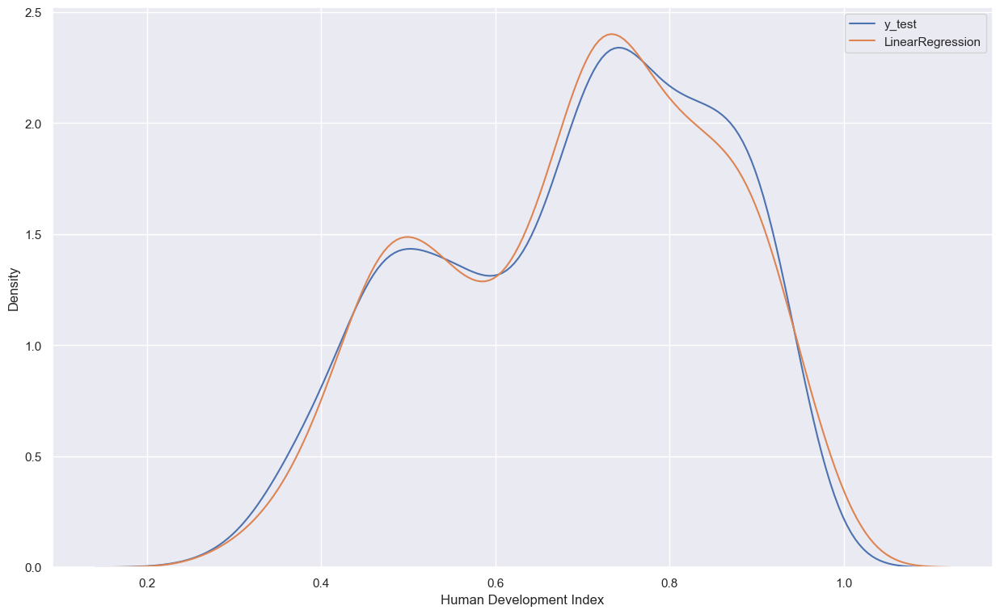

In [203]:
sns.kdeplot(y_test, label="y_test")

sns.kdeplot( y_pred_linear, label="LinearRegression")

plt.legend()

In [213]:
from sklearn.metrics import mean_squared_error, r2_score
MSEL=mean_squared_error(y_test, y_pred_linear)
print("MSE",MSEL)
R2L= r2_score(y_test, y_pred_linear)
print("R2",R2L)


MSE 0.00042552440013918317
R2 0.9839123117101933


In [205]:
random = RandomForestRegressor()

random.fit(X_train, y_train)

y_pred_random = random.predict(X_test)

In [210]:
MSER = mean_squared_error(y_test, y_pred_random)
print("MSE",MSER)
R2R = r2_score(y_test, y_pred_random)
print("R2",R2R)

MSE 3.276601100478487e-05
R2 0.9987612241004912


In [211]:
tree = DecisionTreeRegressor()

tree.fit(X_train, y_train)

y_pred_tree = tree.predict(X_test)
MSET=mean_squared_error(y_test, y_pred_tree)
print("MSE",MSET)
R2T=r2_score(y_test, y_pred_tree)
print("R2",R2T)

MSE 0.0001247775119617225
R2 0.9952825696543812


In [212]:
knn = KNeighborsRegressor()

knn.fit(X_train, y_train)

y_pred_knn = knn.predict(X_test)
MSEK=mean_squared_error(y_test, y_pred_knn)
print("MSE")
R2K= r2_score(y_test, y_pred_knn)
print("R2")

MSE
R2


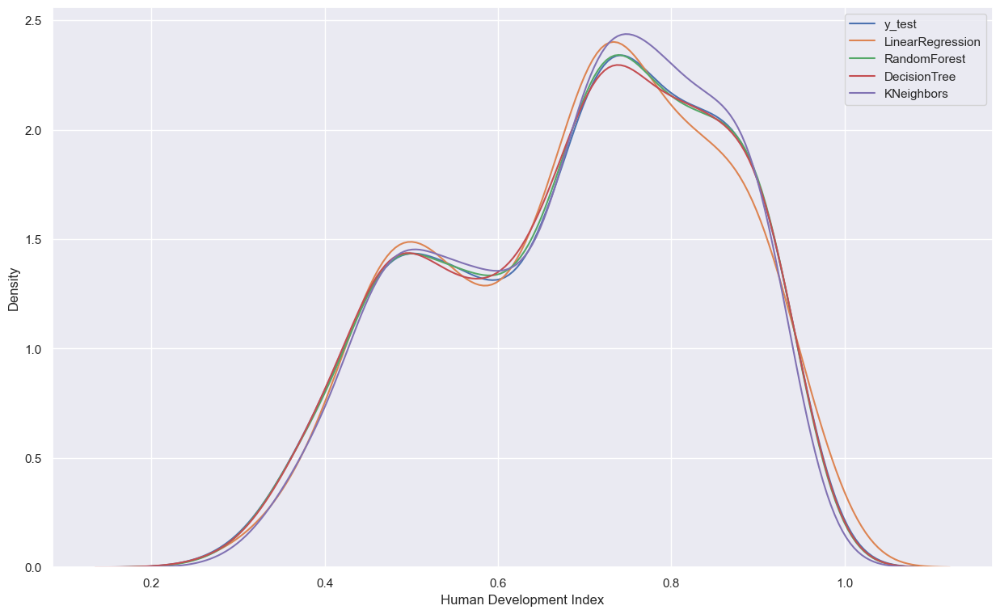

In [209]:
sns.kdeplot(y_test, label="y_test")

sns.kdeplot( y_pred_linear, label="LinearRegression")
sns.kdeplot( y_pred_random, label="RandomForest")
sns.kdeplot( y_pred_tree, label="DecisionTree")
sns.kdeplot( y_pred_knn, label="KNeighbors")


plt.legend()

In [215]:
metrics = {"modelo":["RegressorLineal","DecisionTree","RandomForest","KNeighbor"],
           "MSE":[MSEL,MSET,MSER,MSEK],
           "R2": [R2L,R2T,R2R,R2K]}

df_metrics = pd.DataFrame(metrics)

df_metrics

,modelo,MSE,R2
0,RegressorLineal,0.000426,0.983912
1,DecisionTree,0.000125,0.995283
2,RandomForest,0.000033,0.998761
3,KNeighbor,0.000716,0.972945
